# Microsoft Azure Data Engineering Project

## 0. Project Architecture

This project demonstrates my ability to leverage cutting edge cloud based tools and technologies to engineer data pipelines to move data to and from a variety of sources, adopting the industry best practice Medallion Architecture.

This particular project illustrates my working knowledge of :

- Microsoft Azure 
- Azure Data Lake Storage (ADLS) Gen2 
- Azure Data Factory
- Azure Synapse Analytics
- Databricks | Spark
- MySQL
- MongoDB

These skills are highly transferable across other industy cloud platforms and tools. Whilst this is not a fully fledged data analysis project, it also illustrates my ability to work with both PySpark, pandas and SQL to read, write, clean and transform data.

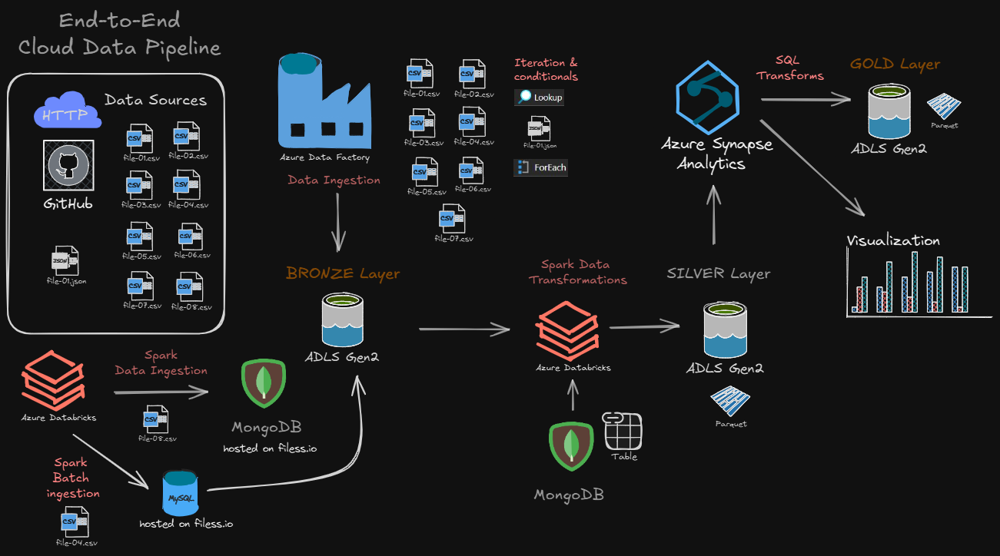

When working on independent data engineering projects, one of the major hurdles is getting (free) access to industry level tools. As far as possible this project has been performed at no cost, taking advantages of free tiers and trial periods.

## 1. Microsoft Azure

The first step is to sign up for a [free trial of Microsoft Azure](https://azure.microsoft.com/en-gb/pricing/offers/ms-azr-0044p) which at the time of writing offers the equivalent of $200 credit to be used within 30 days, and 12 months of selected free services. 

As with all cloud platforms, the biggest challenge is navigating the initial set-up configuration. However, the diagram below illustrates the general hierearch, with a management group having one or more subscriptions, which have one or more resource groups, which in turn have access to one or more resources.

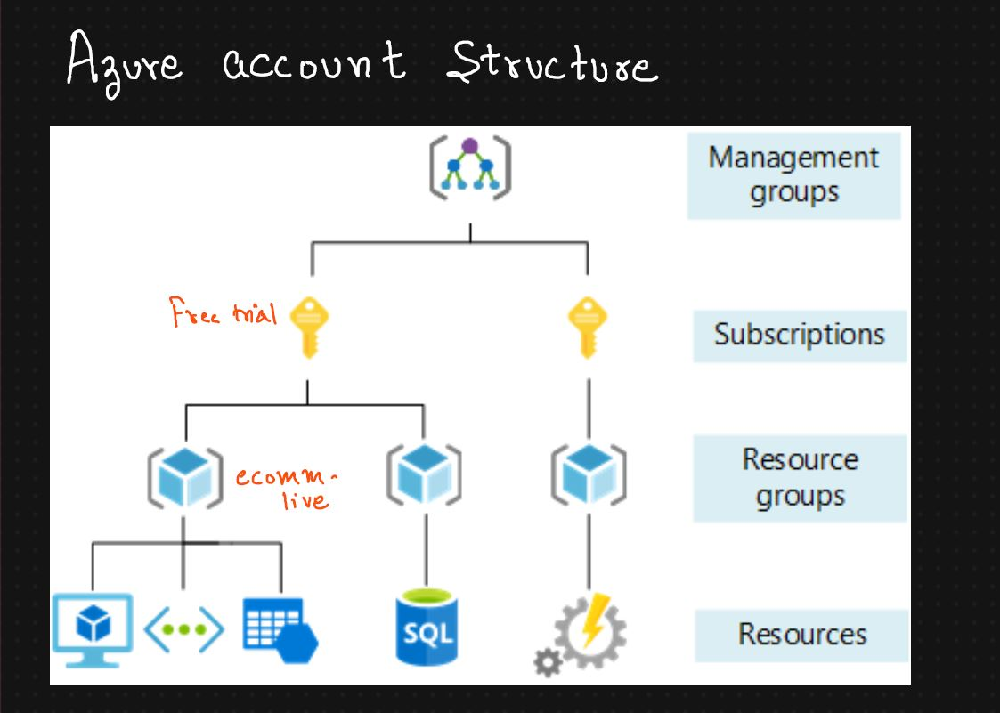

Azure provides extensive [learning documentation](https://azure.microsoft.com/en-gb/get-started/). to help you get started. Access control is provided by way of keys, tokens, and secrets. Care should be taken to ensure these are not exposed. Vaults are provided within the Azure portal for enhanced security.

### Create a Resource Group 
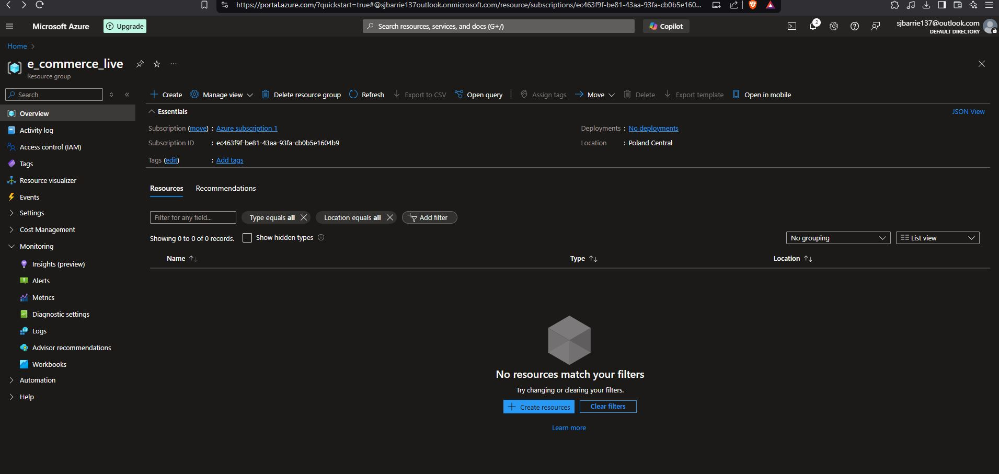

# 2. Project Data

The data was originally hosted on [Kaggle](https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce).

>This is a Brazilian ecommerce public dataset of orders made at Olist Store. The dataset has information of 100k orders from 2016 to 2018 made at multiple marketplaces in Brazil. Its features allows viewing an order from multiple dimensions: from order status, price, payment and freight performance to customer location, product attributes and finally reviews written by customers. We also released a geolocation dataset that relates Brazilian zip codes to lat/lng coordinates.
This is real commercial data, it has been anonymised, and references to the companies and partners in the review text have been replaced with the names of Game of Thrones great houses.

Acknowledgements to Mayank Aggarwal for making the raw csv files available [here](https://github.com/mayank953/BigDataProjects/tree/main/Project-Brazillian%20Ecommerce/Data).

## Source files

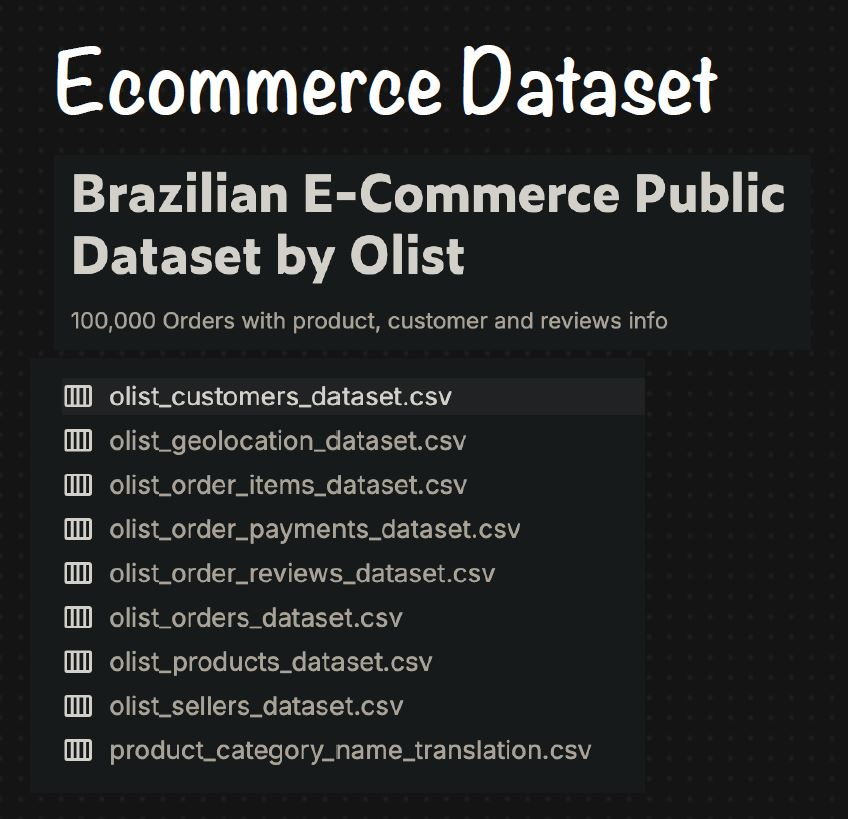


## Schema

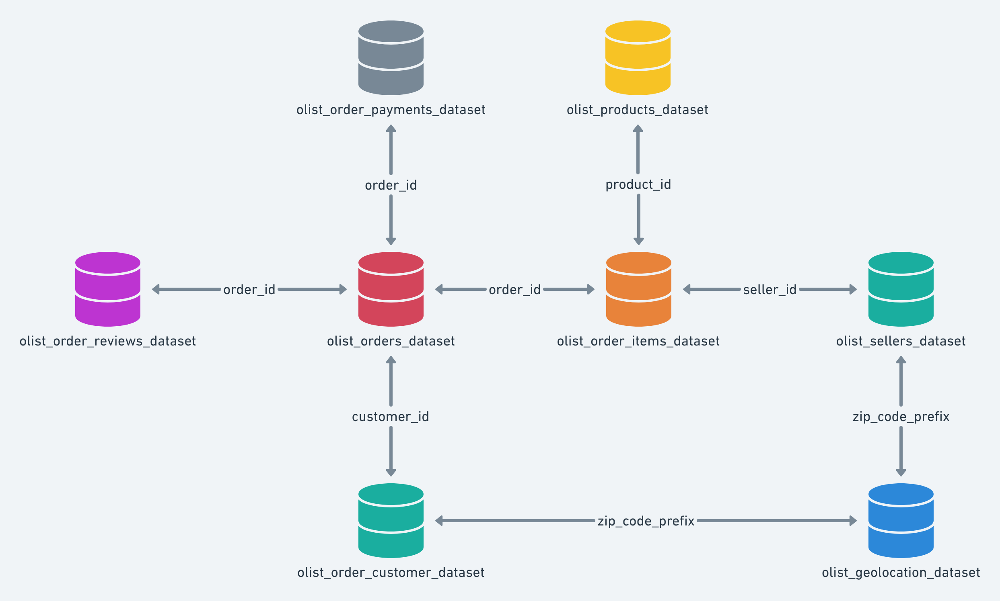

# 3.Databases

If you need to create a database for independent learning purposes, then check out [filess.io](https://filess.io/) which offers a free tier.

For this project I created a MySQL and a MongoDB database. A very useful feature is the Connection Code which is available in a number of programming languages, facilitating easy access to the Database from other sources.


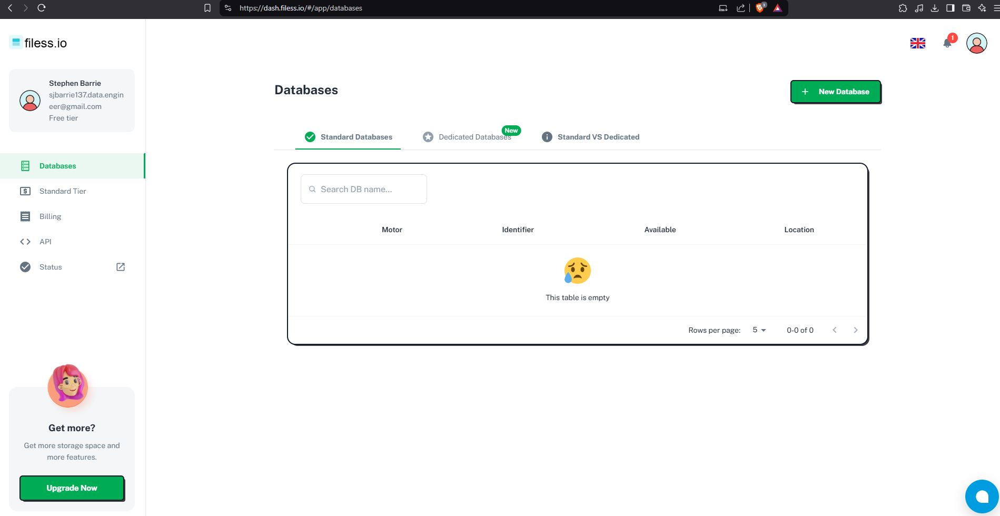

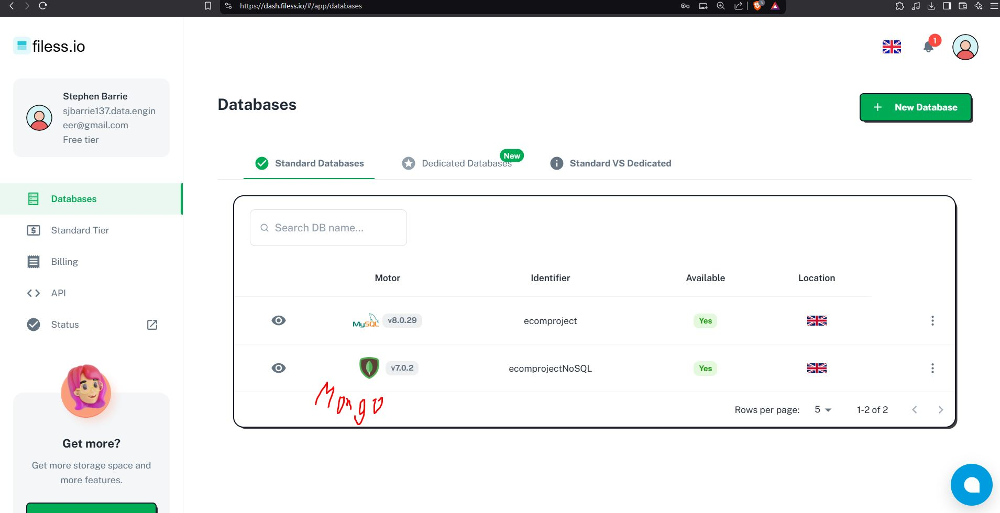

## 3.1 MySQL

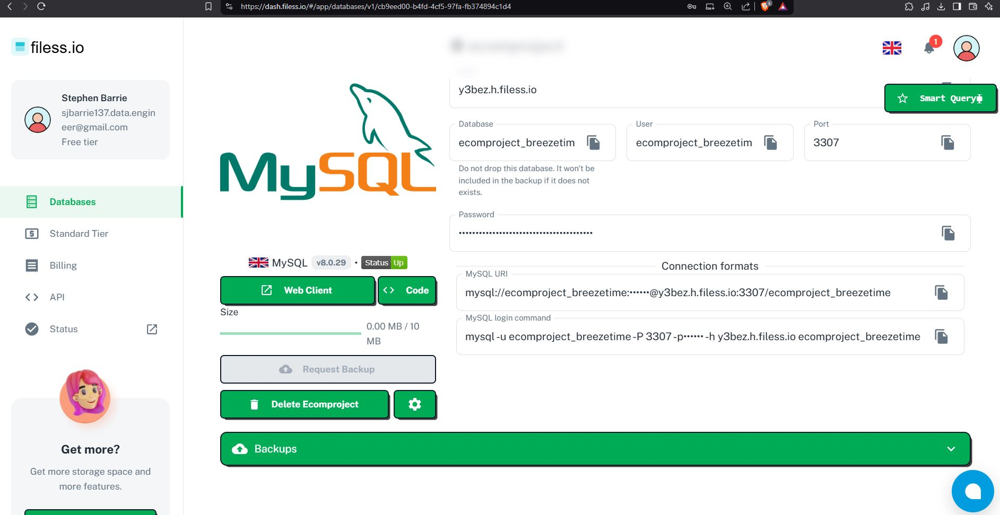

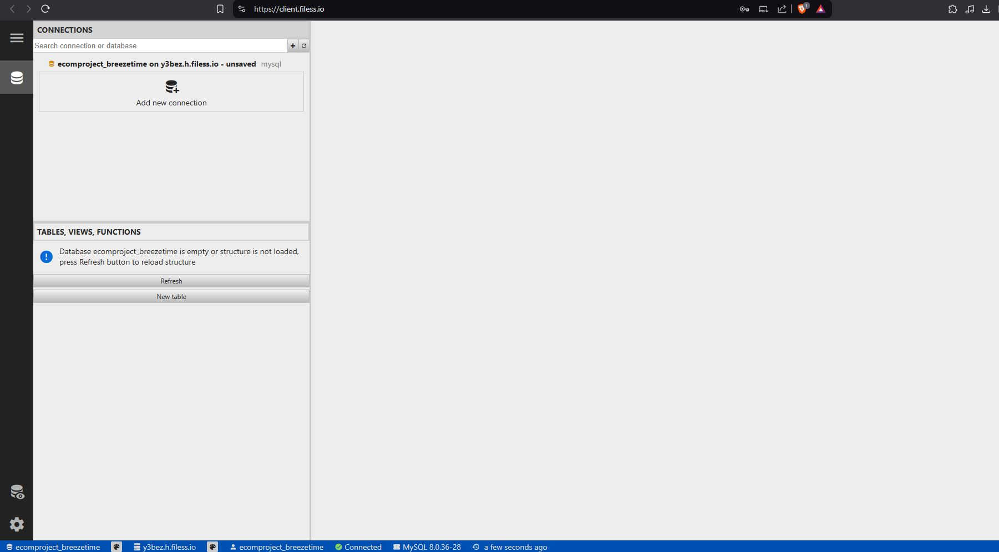


## 3.2 MongoDB
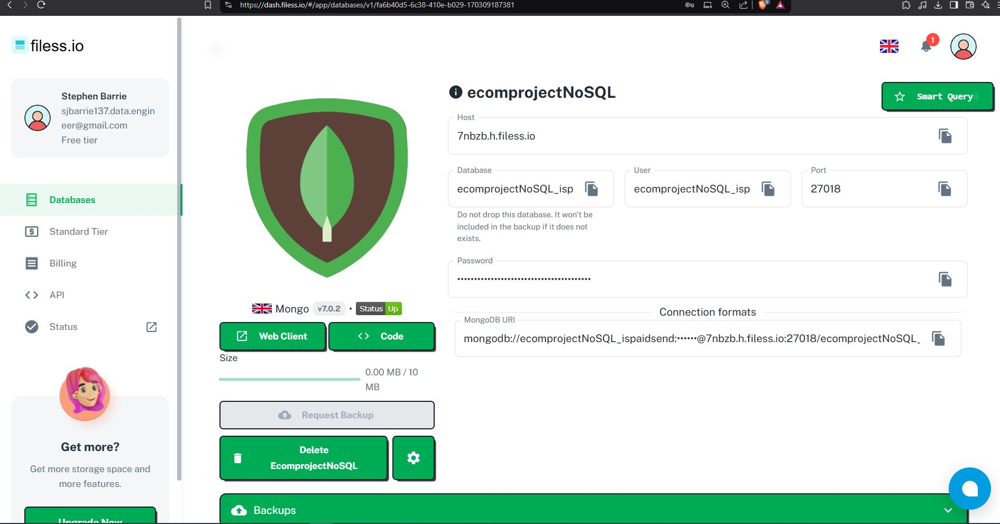

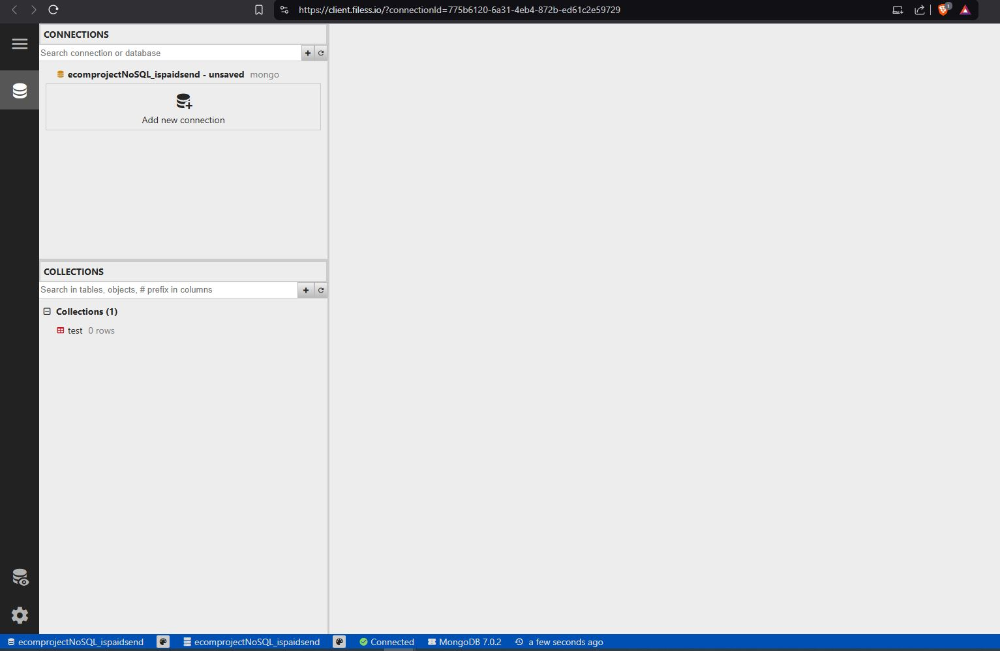


# 4. Databricks

## Connecting to external databases from Databricks

Databricks offers a [free Community Edition](https://login.databricks.com/?dbx_source=CE&intent=CE_SIGN_UP&tuuid=8d37e8ce-279a-4438-8d16-472ceb4bc8aa).

>The Databricks Community Edition is the free version of our cloud-based big data platform. Its users can access a micro-cluster as well as a cluster manager and notebook environment. All users can share their notebooks and host them free of charge with Databricks. We hope this will enable everyone to create new and exciting content that will benefit the entire Apache Spark™ community.

The Databricks Community Edition also comes with a rich portfolio of award-winning training resources that will be expanded over time, making it ideal for developers, data scientists, data engineers and other IT professionals to learn Apache Spark.


## 4.1 Connecting to MySQL from DataBricks

In this step we will work within Databricks to:

- connect to the MySQL database we created on filess.io
- create a database table
- BATCH ingest a csv file held on GitHub
- insert into the MySQL table

`DataBricks Python NoteBook`

In [ ]:
# Connect to MySQL database held on filess.io
import mysql.connector
from mysql.connector import Error
import pandas as pd

# Connection details taken from filess.io
hostname = "y3bez.h.filess.io"
database = "ecomproject_breezetime"
port = 3307
username = "ecomproject_breezetime"
password = "<password>"

# Data file path
url_file_path = "https://raw.githubusercontent.com/mayank953/BigDataProjects/refs/heads/main/Project-Brazillian%20Ecommerce/Data/olist_order_payments_dataset.csv"

# Database table name where data will be ingested
table_name = "ecomm_order_payments"

try:
    # Establish a connection to MySQL server
    connection = mysql.connector.connect(
        host=hostname, 
        database=database,
         user=username,
          password=password,
           port=port
    )
    
    if connection.is_connected():
        db_Info = connection.get_server_info()
        print("Connected to MySQL Server")

        # Create a cursor to execute SQL queries
        cursor = connection.cursor()

        # Drop table of it already exists
        cursor.execute(f"DROP TABLE IF EXISTS `{table_name}`;")
        print(f"Table `{table_name}` dropped if it existed.")

        # Create a table structure to match csv file
        create_table_query = f"""
        CREATE TABLE {table_name} (
            order_id VARCHAR(50),
            payment_sequential INT,
            payment_type VARCHAR(20),
            payment_installments INT,
            payment_value FLOAT
        );
        """
        cursor.execute(create_table_query)
        print(f"Table `{table_name}` created successfully!")

        # Load the csv data into a pandas DataFrame
        order_payments = pd.read_csv(url_file_path)
       
        print(f"CSV data loaded into a pandas DataFrame.")     
        
        # Insert data in batches of 1000 records
        batch_size = 1000
        total_records = len(order_payments)

        print(f"Starting data insertion into `{table_name}` in batches of {batch_size} records.")
        for start in range(0, total_records, batch_size):
            end = start + batch_size
            batch = order_payments.iloc[start:end] # Get the current batch of records

            # Convert batch to list of tuples for MySQL insertion                     
            batch_records = [
                tuple(row) for row in batch.itertuples(index=False, name=None)
            ]
            
            #Prepare the INSERT query
            insert_query = f"""
            INSERT INTO {table_name}
            (order_id, payment_sequential, payment_type, payment_installments, payment_value)
            VALUES (%s, %s, %s, %s, %s);
            """
            
            # Execute the INSERTION query
            cursor.executemany(insert_query, batch_records)
            connection.commit()
            print(f"Inserted records {start + 1} to {min(end, total_records)} successfully.")

        print(f"All `{total_records}` records inserted successfully into `{table_name}`.")

            
except Error as e:
    # Error handling
    print("Error while connecting to MySQL or inserting data", e)

finally:
    # Close the cursor and connection
    if connection.is_connected():
        cursor.close()
        connection.close()
        print("MySQL connection is closed.")

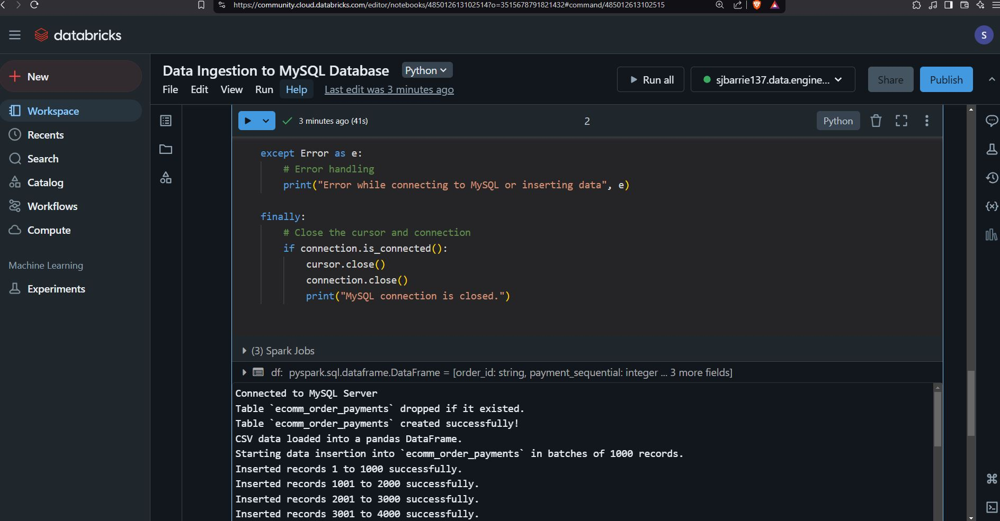

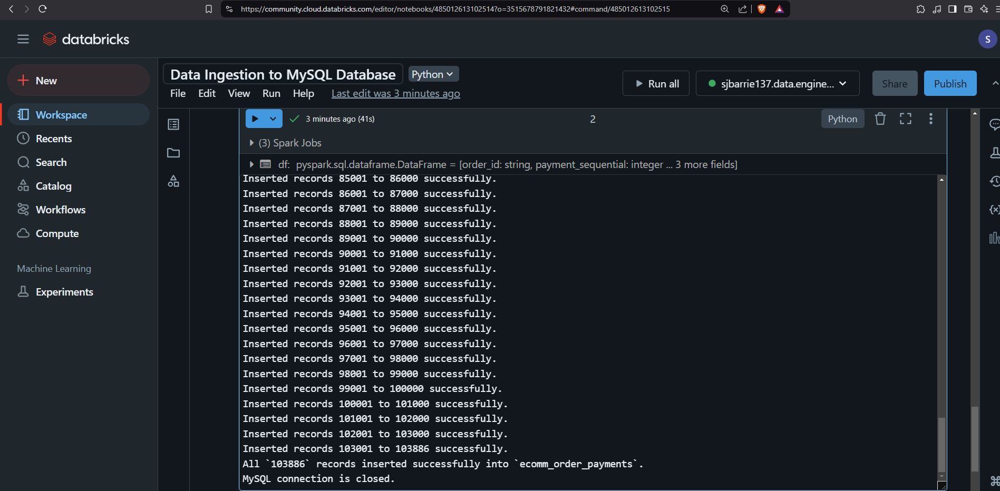

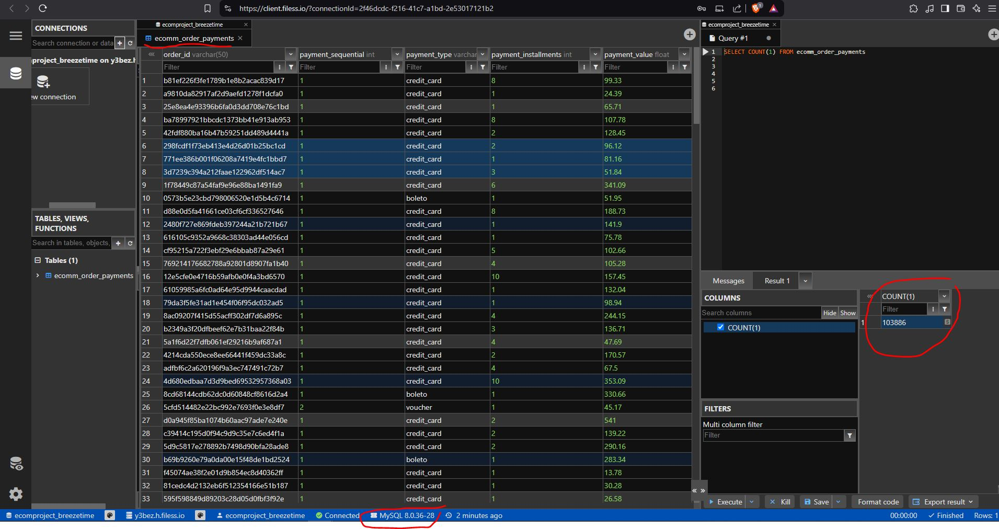

## 4.2 Connecting to MongoDB from DataBricks

In this step we will work within Databricks to:

- connect to the MongoDB database we created on filess.io
- create a collection fron the csv held on GitHub
- insert into the MongoDB collection

`DataBricks Python NoteBook`

In [ ]:
# importing module
import pandas as pd
from pymongo import MongoClient

#csv_file_path = "dbfs:/FileStore/product_category_name_translation.csv"
url_file_path = "https://raw.githubusercontent.com/mayank953/BigDataProjects/refs/heads/main/Project-Brazillian%20Ecommerce/Data/product_category_name_translation.csv"

## Load the product_category csv file into a pandas dataframe
try:

    product_category_df = pd.read_csv(url_file_path)    
    
except FileNotFoundError:
    print("Error: 'product_category_name_translation.csv' not found.")
    exit()

## Mongo DB connection configuration 
hostname = "7nbzb.h.filess.io"
database = "ecomprojectNoSQL_ispaidsend"
port = "27018"
username = "ecomprojectNoSQL_ispaidsend"
password = "<password>"

uri = "mongodb://" + username + ":" + password + "@" + hostname + ":" + port + "/" + database

try:    
    ## Establish a connection to MongoDB
    client = MongoClient(uri)
    db = client[database]

    ## Select the collection (or create it if it doesn't exist)
    collection = db["product_categories"]

    ## Convert the DataFrame to a list of dictionaries for insertion into MongoDB 
    data_to_insert = product_category_df.to_dict(orient="records")

    ## Insert the data into the collection
    collection.insert_many(data_to_insert)

    print("Data uploaded to MongoDB successfully!")

except Exception as e:
    print(f"An error occurred: {e}")

finally:
    # Close the MongoDB connection
    if client:
        client.close()

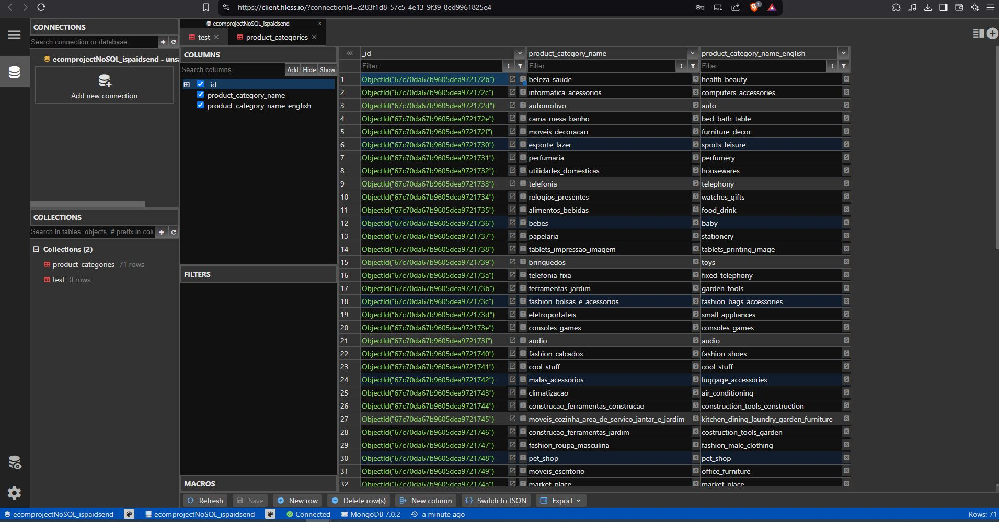

# 5. Azure Data Factory

Azure Data Factory is a cloud ETL (Extract, Transform, Load) tool that collects data from different sources (INGESTION), cleans and organises it (TRANSFORMATION) and moves it (LOAD) to where we need it (SINK).



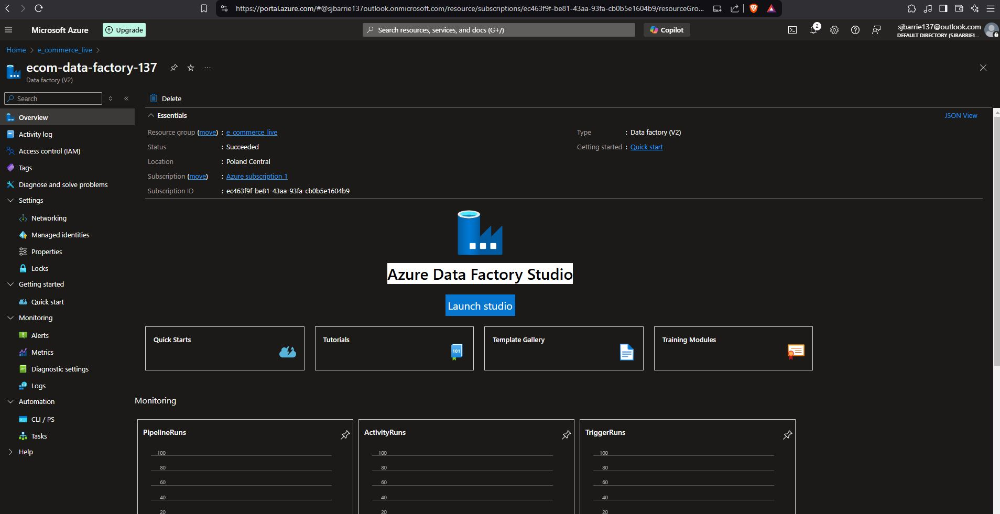

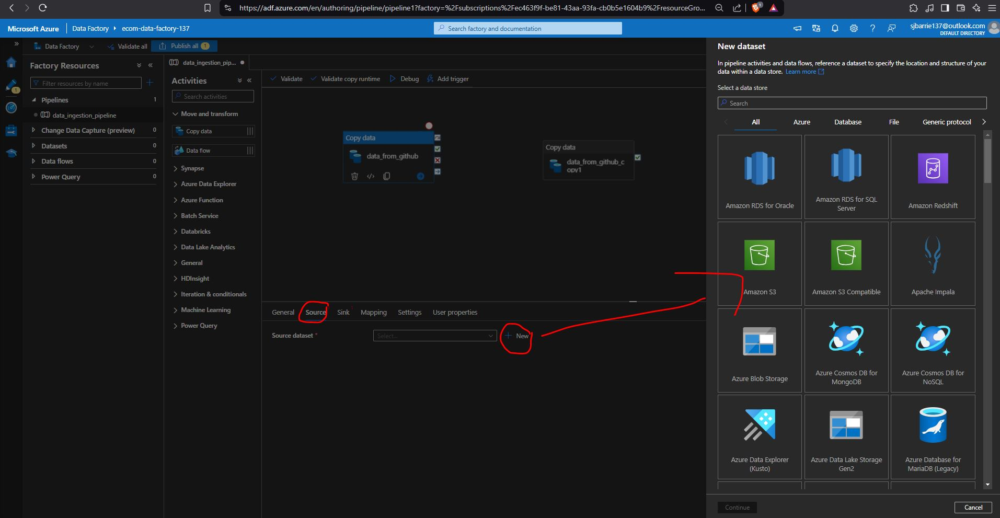

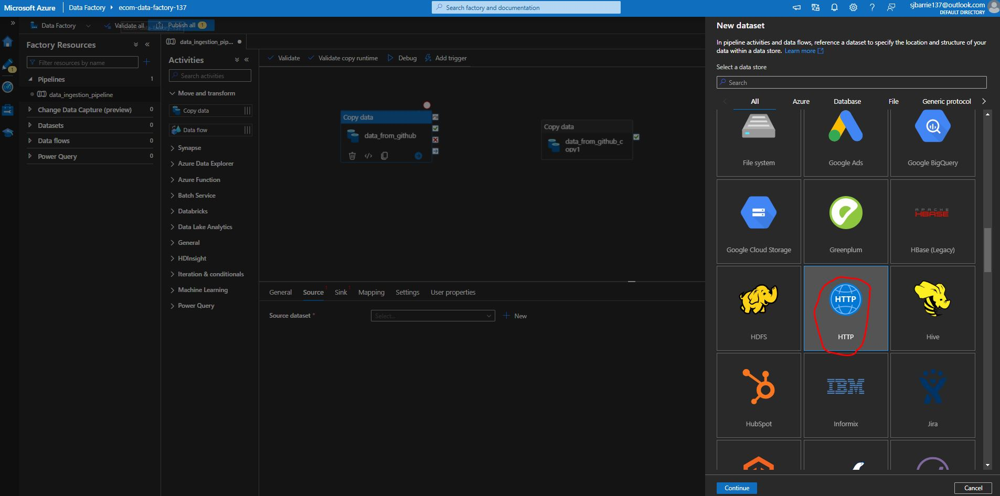

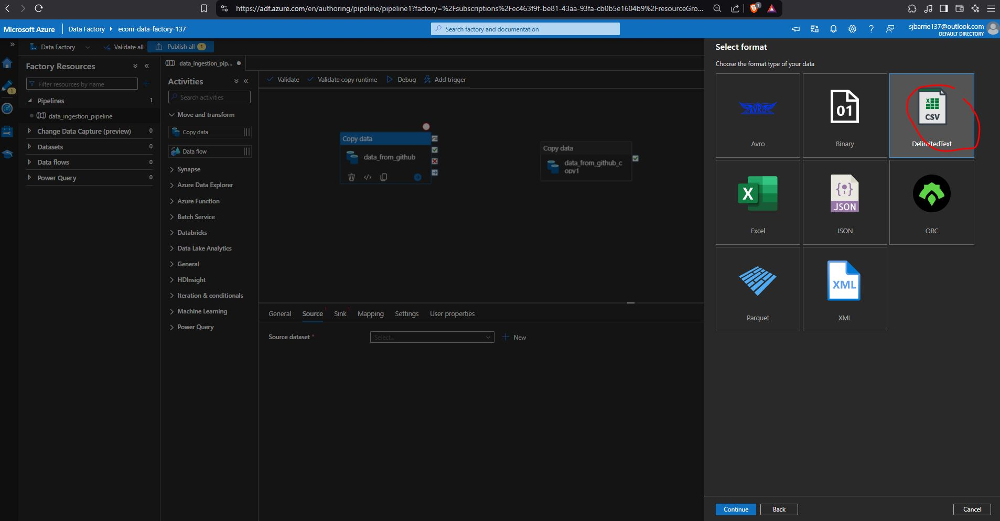

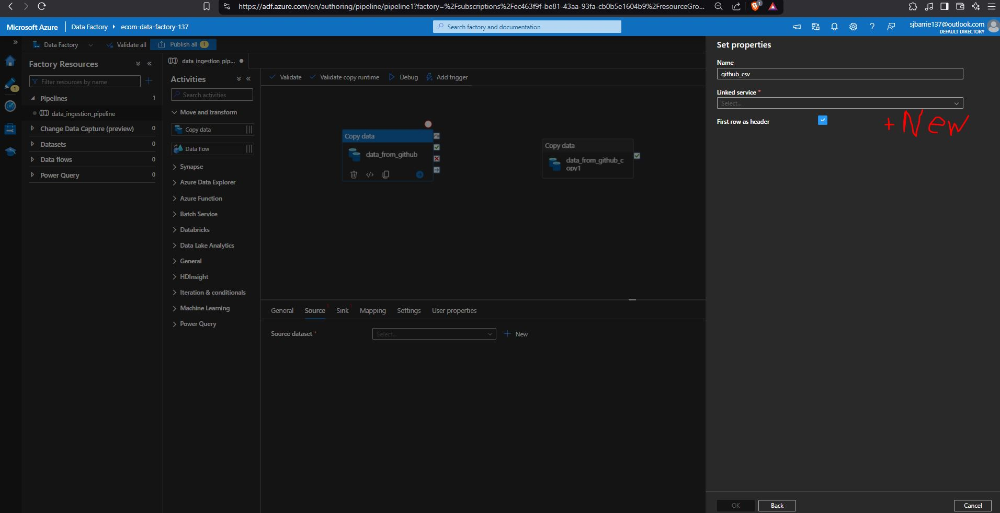

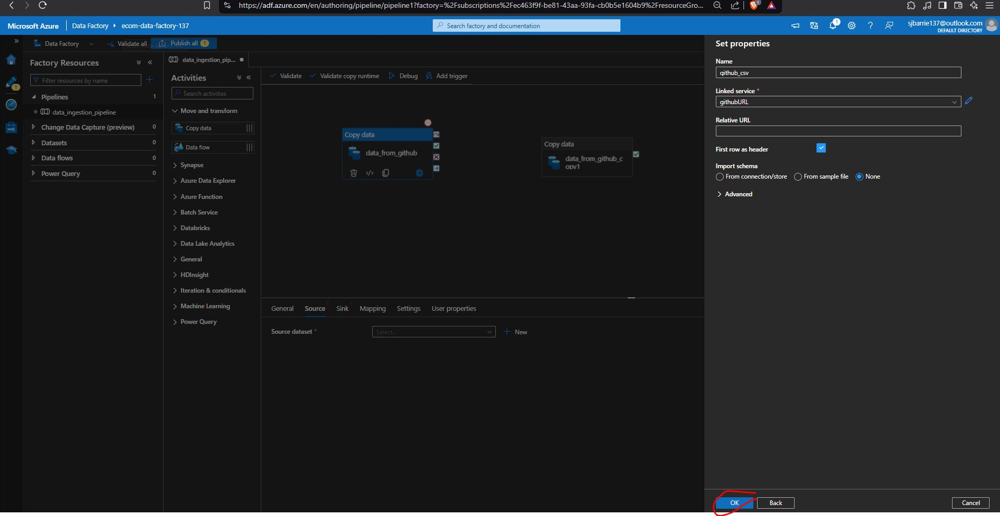

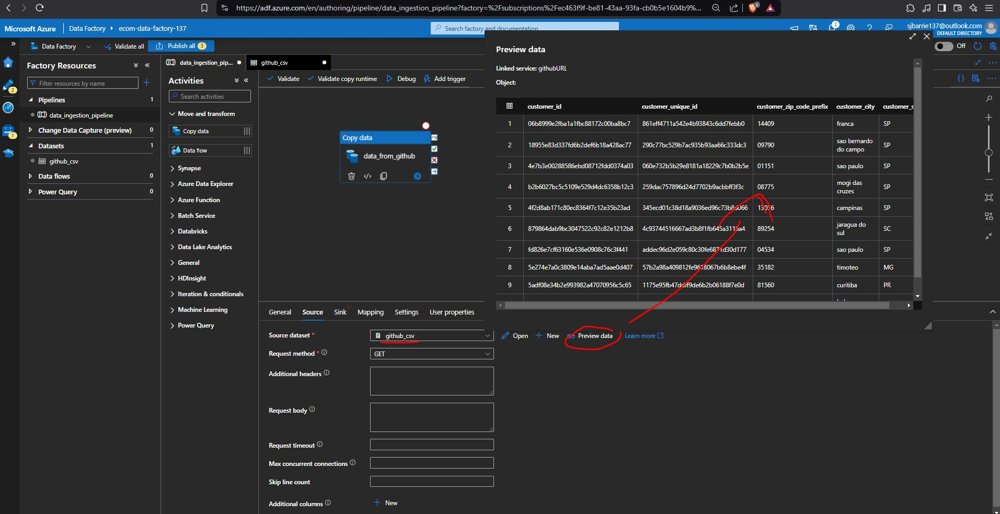

We have manually configured the `olist_customers_dataset`, but by splitting the file paths into a base url, and a relative url, we can iterate over all of the remaining csv files to automate the source configuration process.

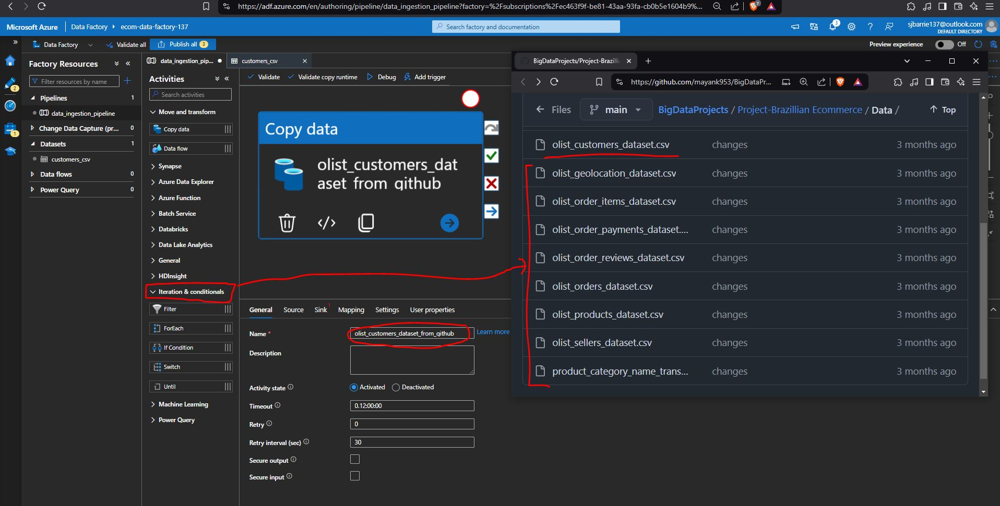

# 6. Azure Data Lake Storage (ADLS)Gen 2

ADLSGen2 is a secure cloud platform that provides scalable, cost effective storage for Big Data analytics.

We will be taking the csv files from **source** : `Github` and moving them to a **data sink** : `Azure Data Lake Storage Gen2`. So let's first create a storage resource:

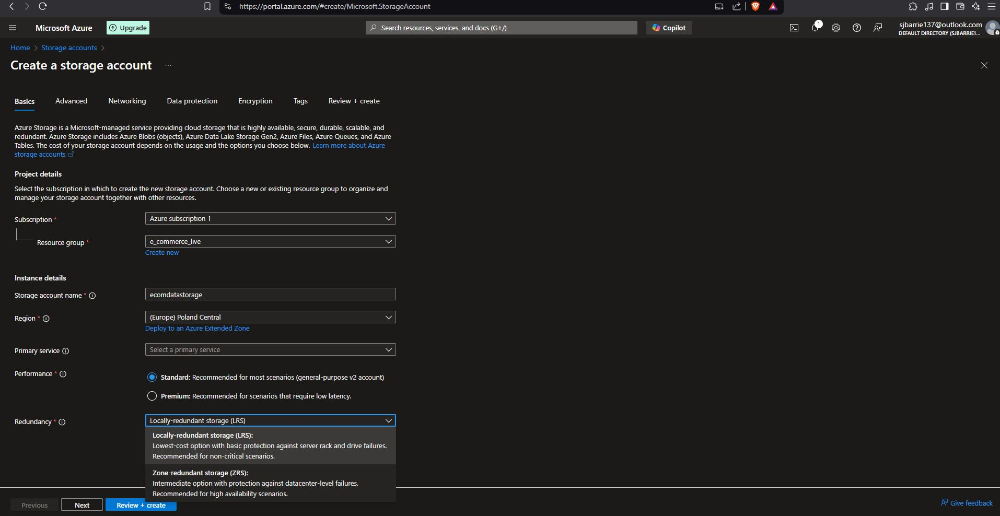

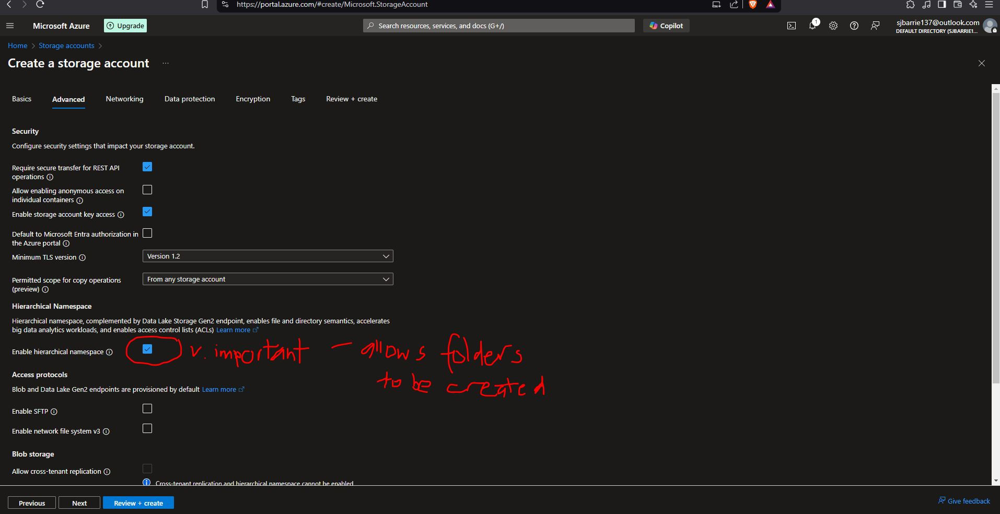

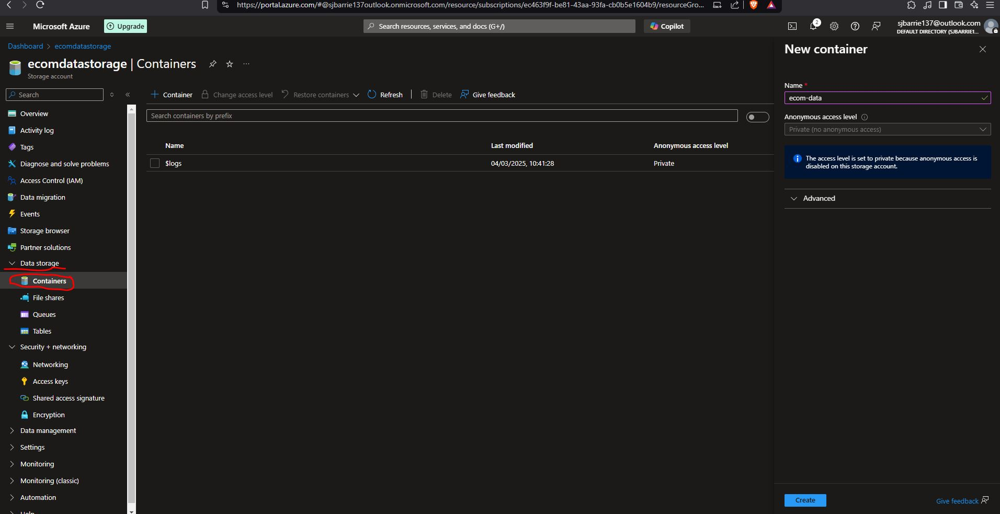

# 7. Medallion Architecture

In this project we will follow industry best practice, and adopt the [Medallion architecture](https://www.databricks.com/glossary/medallion-architecture), as illustrated below.

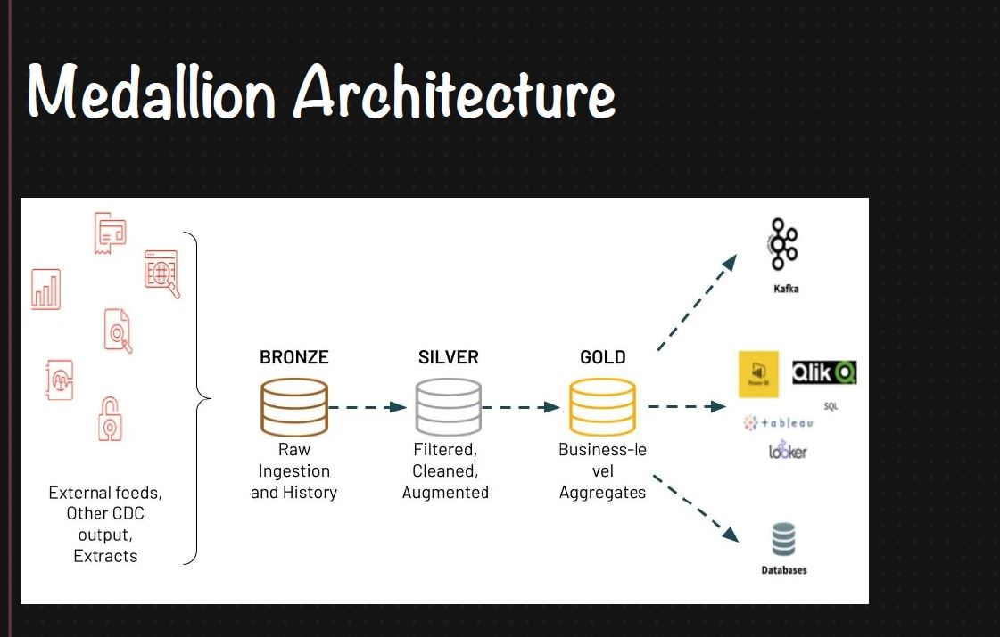

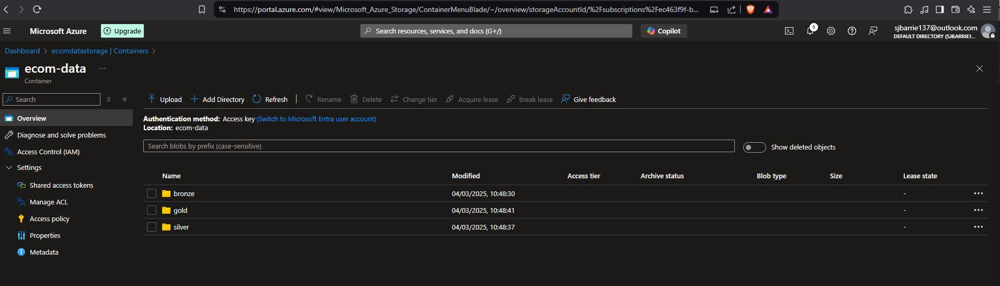

# 8. Create a data ingestion Pipeline to connect to ADLSGen2 data sink

Using Azure Data Factory, we can create a data ingestion Pipeline to move the data from source (GitHub) to sink (ADLSGen2) :

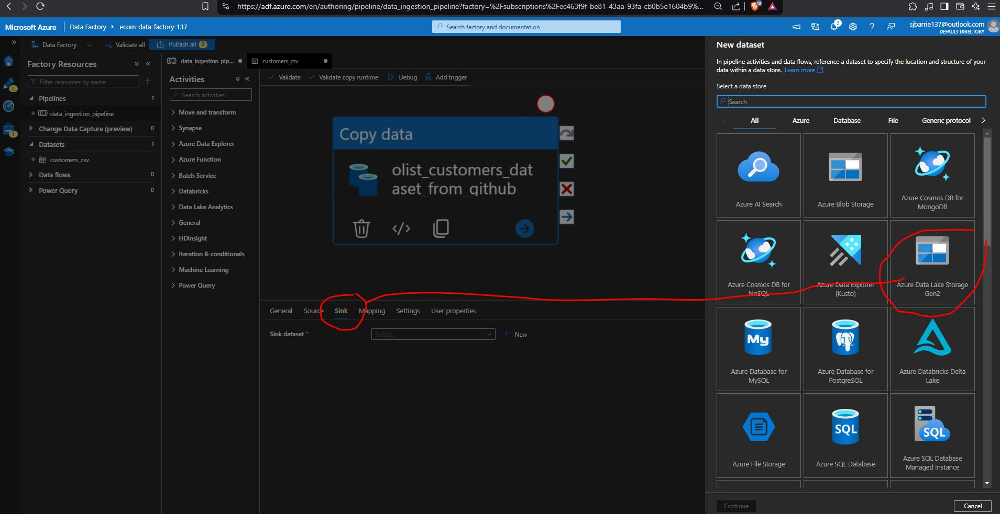

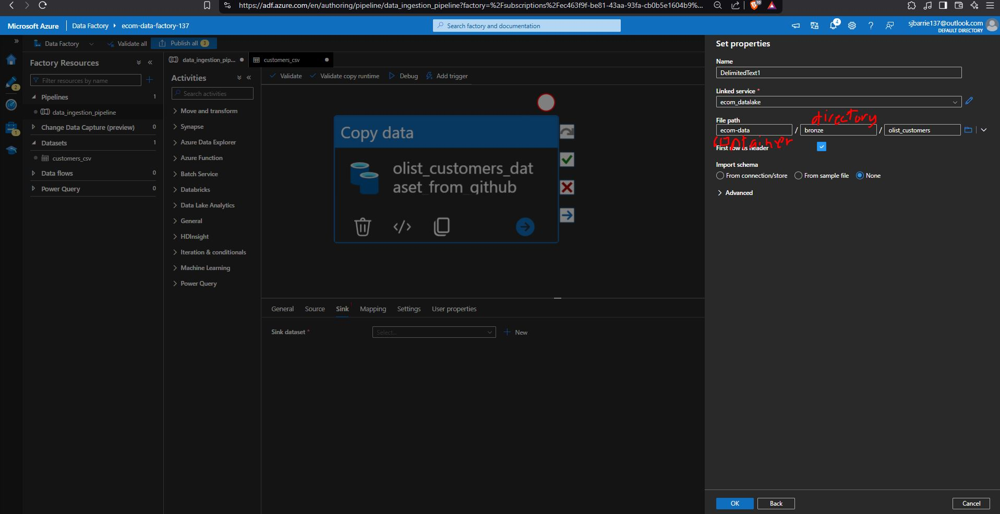

Hit **Debug** to run the Pipeline, in our case move the csv file stored on Github to our Azure Data Storage container.

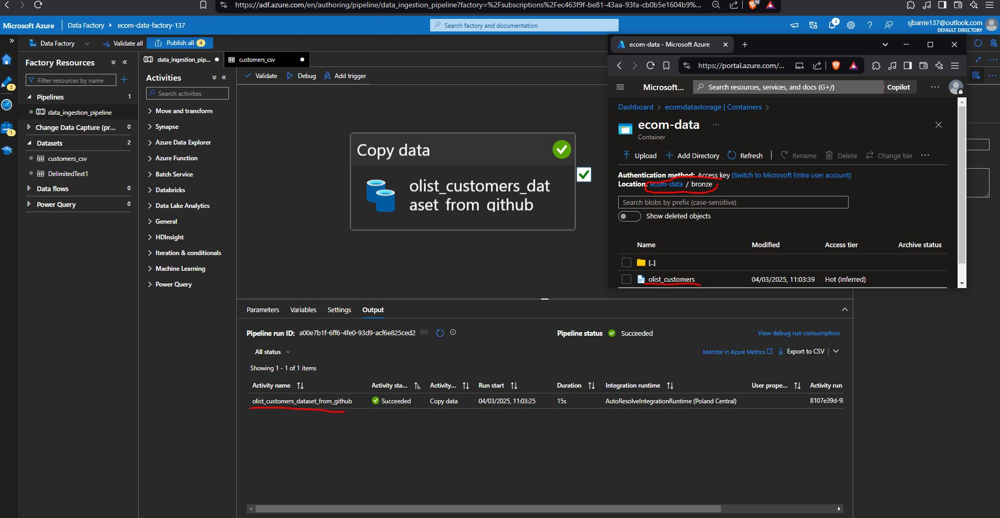

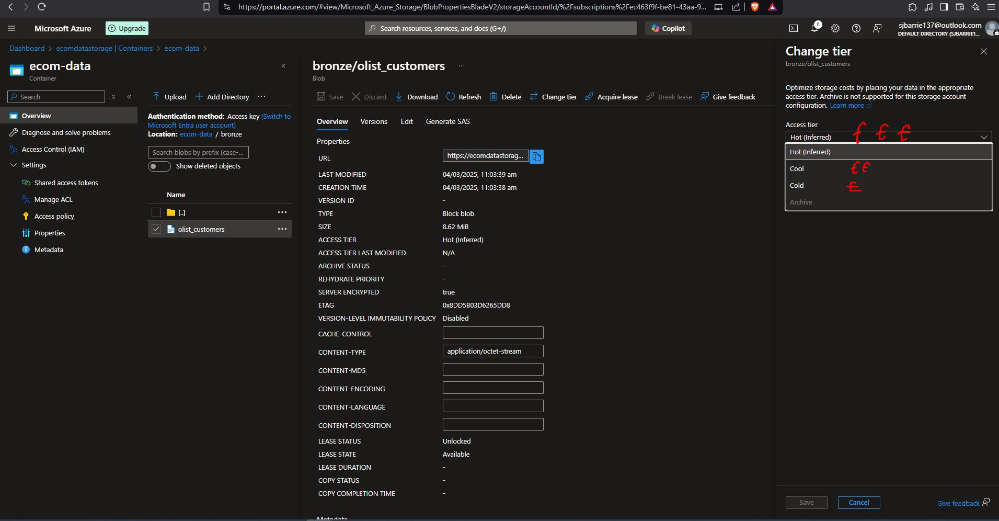

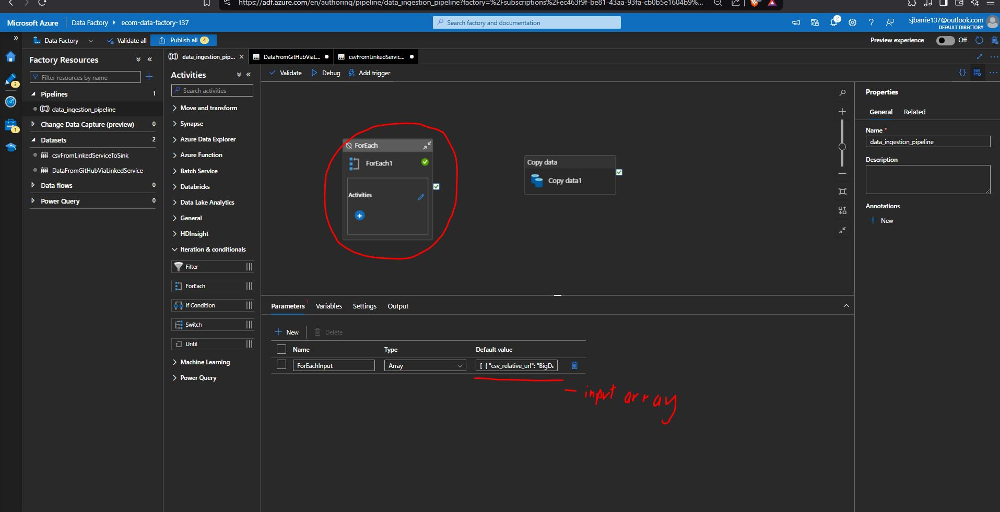

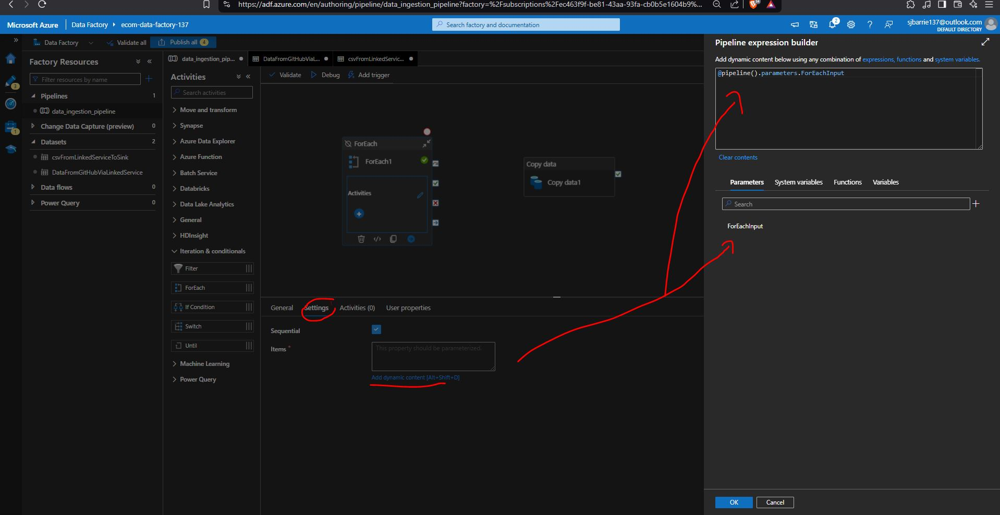

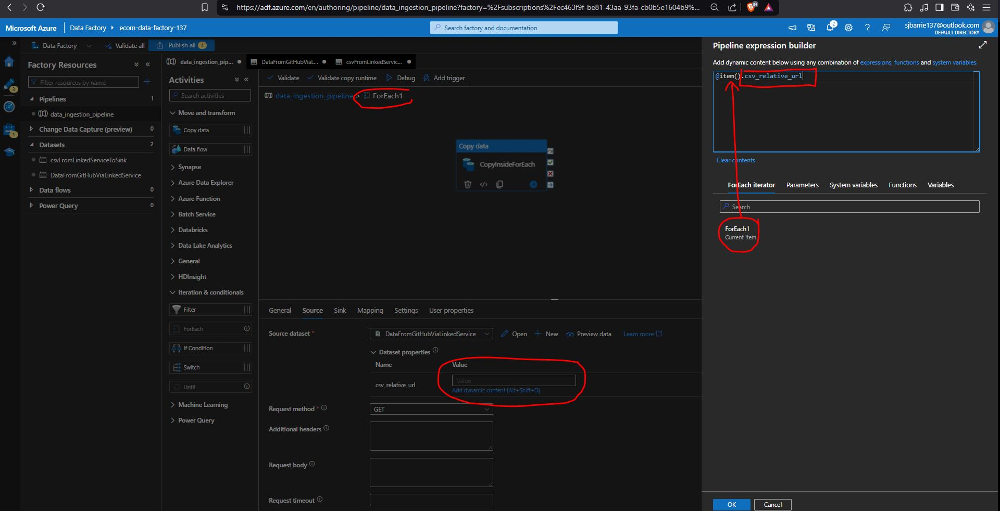

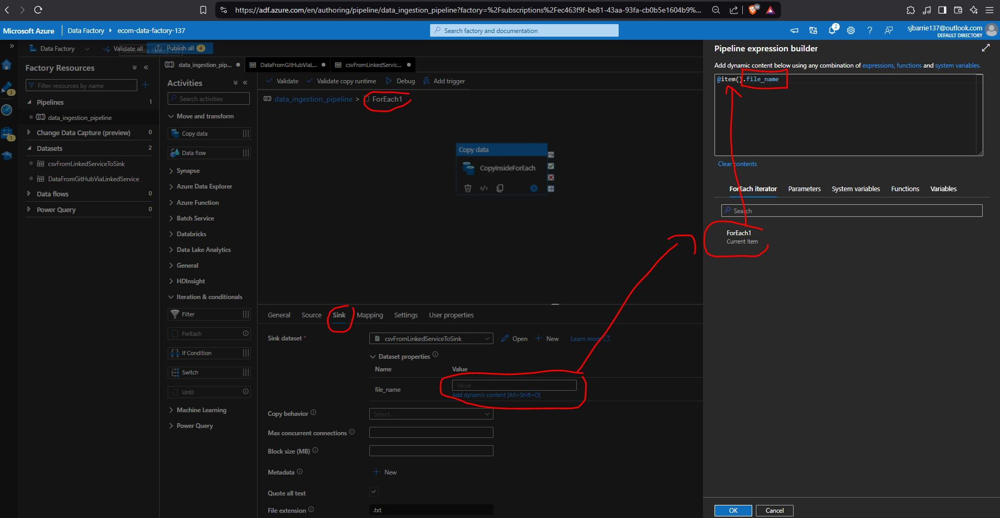

# 9. Paramaterisation

Initially, I manually configured the `olist_customers_dataset`, but by splitting the file paths into a base and relative url, and a file name, I can iterate over all of the remaining csv files to automate the source and sink configuration process.

To do this, I will use the Azure Data Factory activity: `Iteration & conditionals:For Each` and set each input as the following array :

`input_array.json`

In [ ]:
[

{
"csv_relative_url": "BigDataProjects/refs/heads/main/Project-Brazillian%20Ecommerce/Data/olist_customers_dataset.csv", #source
"file_name": "olist_customers_dataset.csv" #sink
},

{
"csv_relative_url": "BigDataProjects/refs/heads/main/Project-Brazillian%20Ecommerce/Data/olist_geolocation_dataset.csv",
"file_name": "olist_geolocation_dataset.csv"
},

{
"csv_relative_url": "BigDataProjects/refs/heads/main/Project-Brazillian%20Ecommerce/Data/olist_order_items_dataset.csv",
"file_name": "olist_order_items_dataset.csv"
},

{
"csv_relative_url": "BigDataProjects/refs/heads/main/Project-Brazillian%20Ecommerce/Data/olist_order_reviews_dataset.csv",
"file_name": "olist_order_reviews_dataset.csv"
},

{
"csv_relative_url": "BigDataProjects/refs/heads/main/Project-Brazillian%20Ecommerce/Data/olist_orders_dataset.csv",
"file_name": "olist_orders_dataset.csv"
},

{
"csv_relative_url": "BigDataProjects/refs/heads/main/Project-Brazillian%20Ecommerce/Data/olist_products_dataset.csv",
"file_name": "olist_products_dataset.csv"
},

{
"csv_relative_url": "BigDataProjects/refs/heads/main/Project-Brazillian%20Ecommerce/Data/olist_sellers_dataset.csv",
"file_name": "olist_sellers_dataset.csv"
}

]

Rather than copy the array into the value parameter, I will use another ADF Activity: `Lookup` to read in the array from the JSON file held on GitGub. This is better practice as it reduces the risk of error.

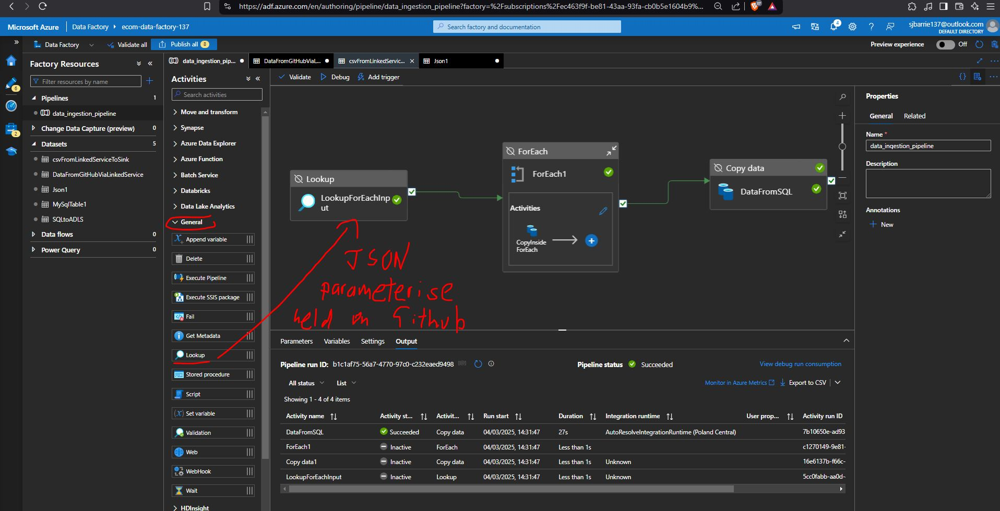

# 10. Creating Linked Service to facilitate connection to MySQL database

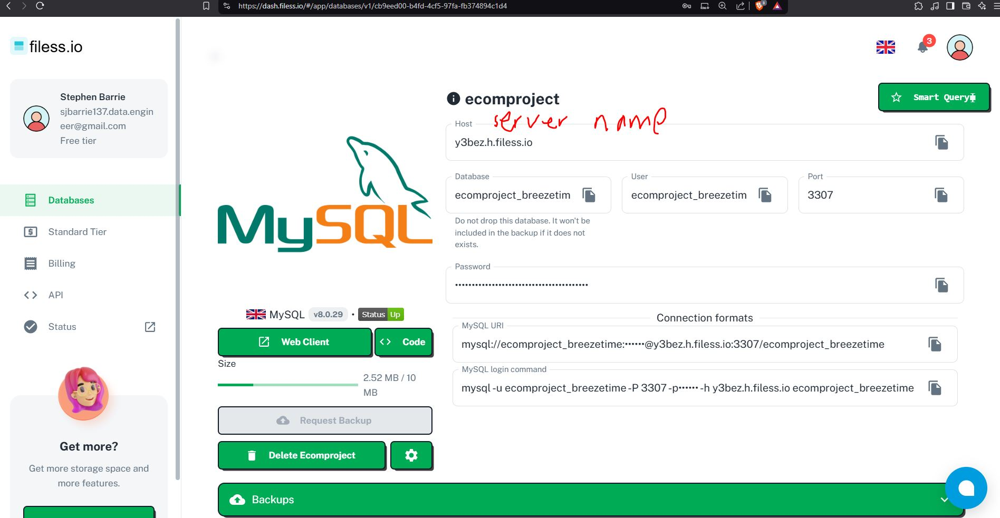

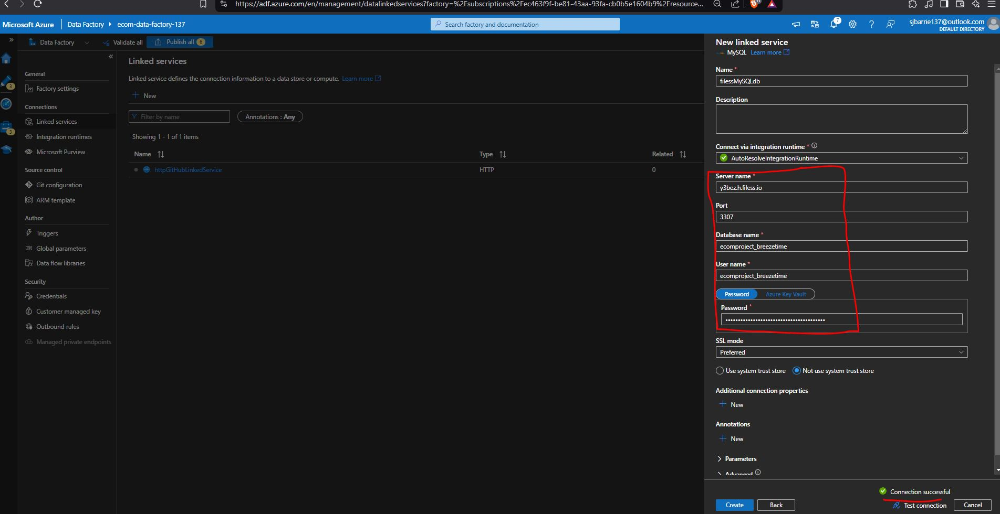


# 11. Azure Databricks Workflow

I will be using Databricks to:

- read raw data from ADLSGen2 BRONZE layer
- perform basic transformation using Spark to clean, rename, filter etc
- perform join operations to integrate multiple datasets
- enrich the data via MongoDB
- perform aggregation and derive insights
- write final data back to ADLSGen2 SILVER layer

## Reading a csv file stored in ADLSGen2 BRONZE layer

https://learn.microsoft.com/en-us/azure/databricks/connect/storage/tutorial-azure-storage

Step 1: Create a Microsoft Entra ID service principal

Step 2: Create a client secret for your service principal

Step 3: Grant the service principal access to Azure Data Lake Storage Gen2

Step 4: Add the client secret to Azure Key Vault

Step 5: Configure your Azure key vault instance for Azure Databricks

Step 6: Create Azure Key Vault-backed secret scope in your Azure Databricks workspace

In [ ]:
# Access configuration for ADLSGen2
container = "ecom-data"
storage_account = "ecomdatastorage"
application_id = "fb7ba273-59ce-42eb-91d7-4d054efd9277" #Application(client)ID
directory_id = "9304b1b4-1646-4e1f-8059-6f38efeb3f40" #Directory(tenant)ID
service_credential = "<client_secrets_value>" #Client secrets - value

spark.conf.set(f"fs.azure.account.auth.type.{storage_account}.dfs.core.windows.net", "OAuth")
spark.conf.set(f"fs.azure.account.oauth.provider.type.{storage_account}.dfs.core.windows.net", "org.apache.hadoop.fs.azurebfs.oauth2.ClientCredsTokenProvider")
spark.conf.set(f"fs.azure.account.oauth2.client.id.{storage_account}.dfs.core.windows.net", application_id)
spark.conf.set(f"fs.azure.account.oauth2.client.secret.{storage_account}.dfs.core.windows.net", service_credential)
spark.conf.set(f"fs.azure.account.oauth2.client.endpoint.{storage_account}.dfs.core.windows.net", f"https://login.microsoftonline.com/{directory_id}/oauth2/token")

In [ ]:
# specify directory
path_to_directory = "bronze/"

# List files in the directory
files = dbutils.fs.ls(f"abfss://{container}@{storage_account}.dfs.core.windows.net/{path_to_directory}")

# Create a dictionary to hold DataFrames for each file
dataframes = {}

# Iterate through the files
for file in files:
    if file.name.endswith('.csv'):  # Check if the file is a CSV
        # Create a DataFrame for each CSV file
        df_name = file.name.replace('.csv', '')  # Create a name for the DataFrame (remove .csv)
        df = spark.read \
            .format("csv") \
            .option("header", "true") \
            .option("inferSchema", "true") \
            .load(file.path)  # Load the CSV file
        
        # Store the DataFrame in the dictionary
        dataframes[df_name] = df

# Now you can access each DataFrame by its name
for name, df in dataframes.items():
    print(f"DataFrame for {name}:")
    df.show()  # Display the contents of the DataFrame

The transformation scripts are included in a separate file `Transforms.py`.

# 12. Azure Synapse

So far I have :

- ingested raw csv data and stored it in the BRONZE layer of ADLSGen2
- performed Spark transformations within DataBricks and written the data to the SILVER layer of ADLSGen2 

It is now time to leverage Azure Synapse Analytics to derive insights and write the final data to the GOLD layer for serving to clients, data scientists, analysts etc.



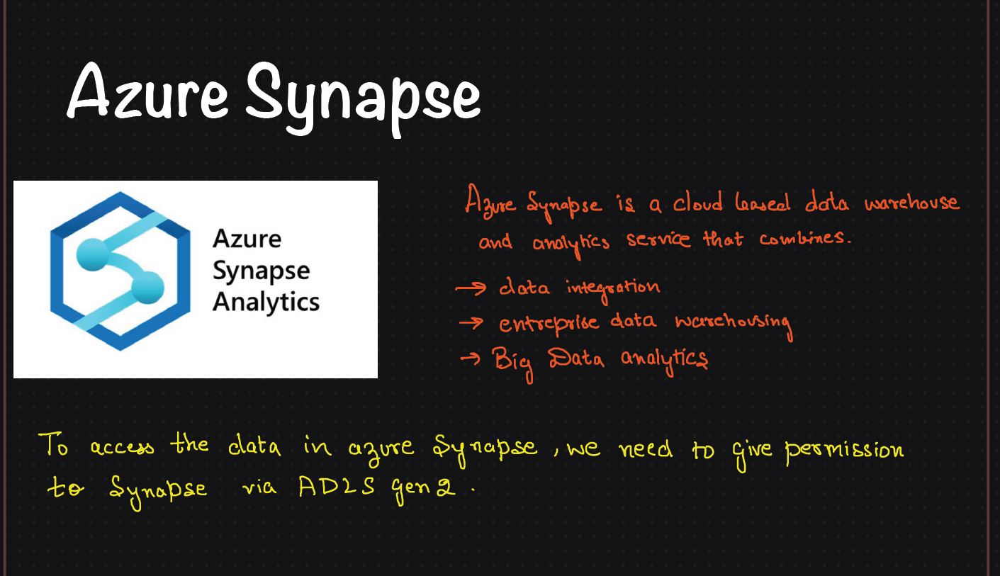

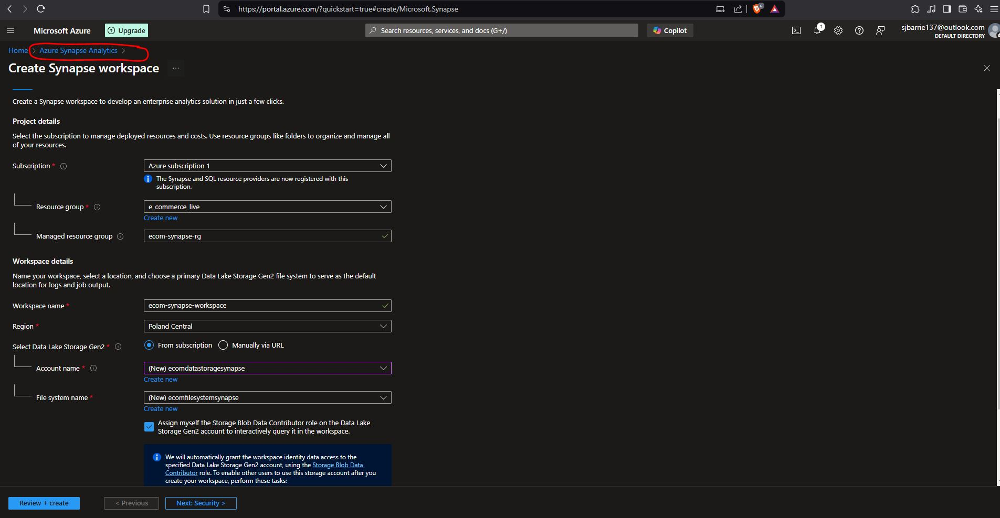

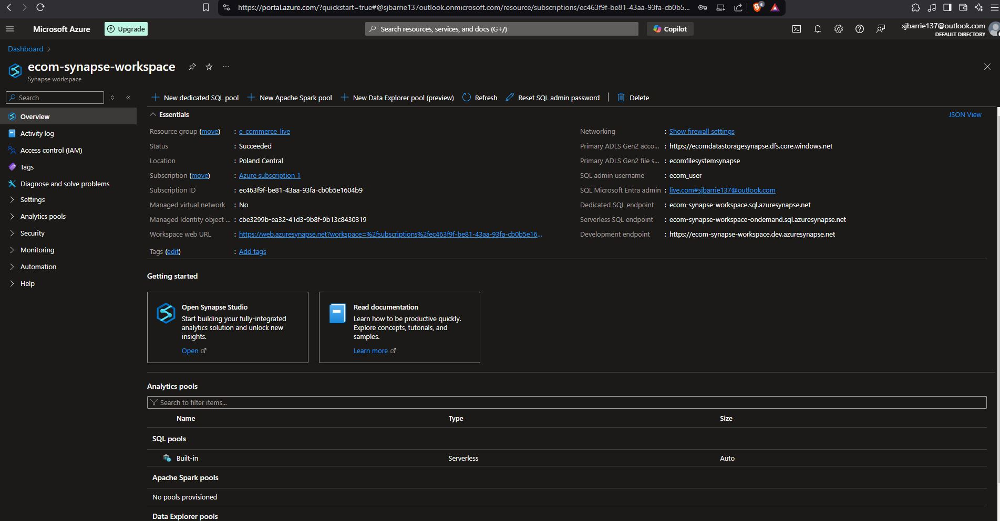

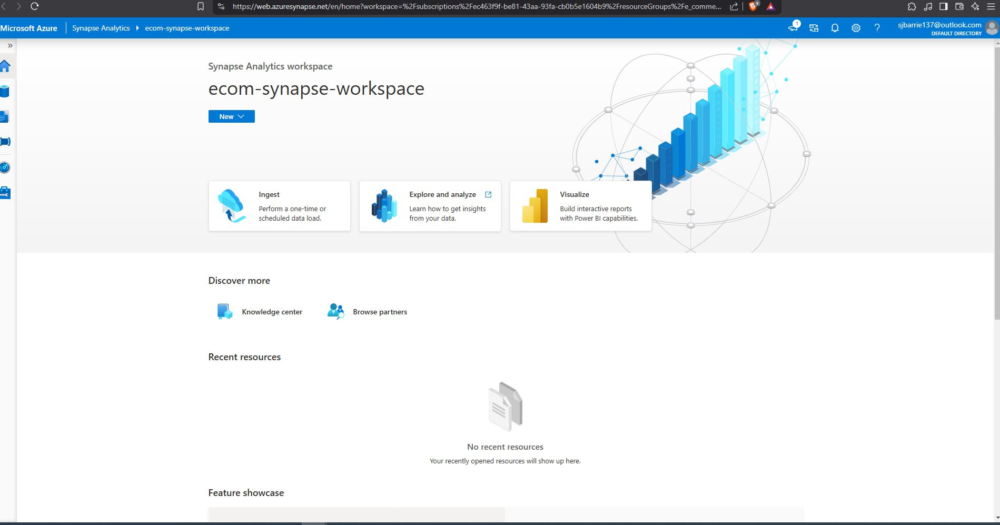

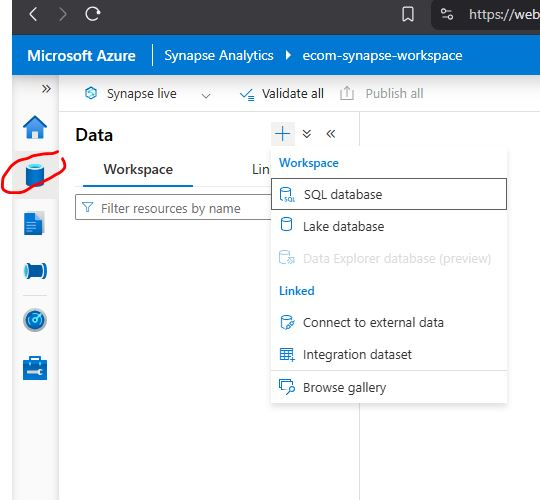

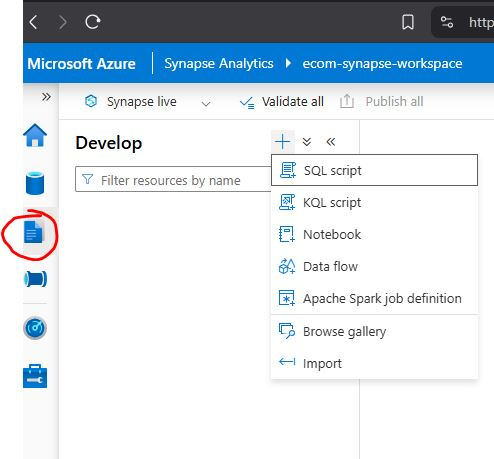

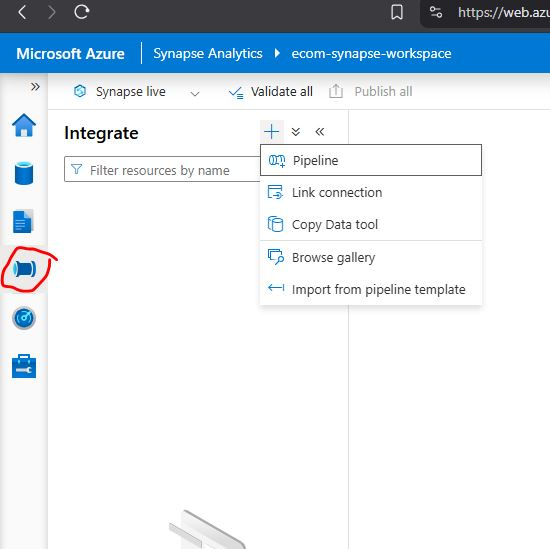

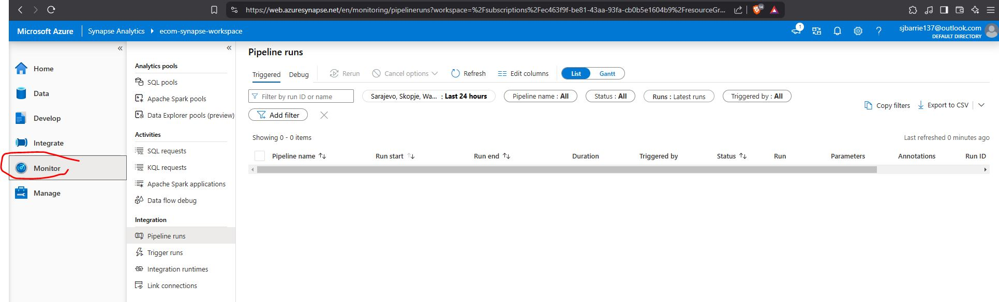

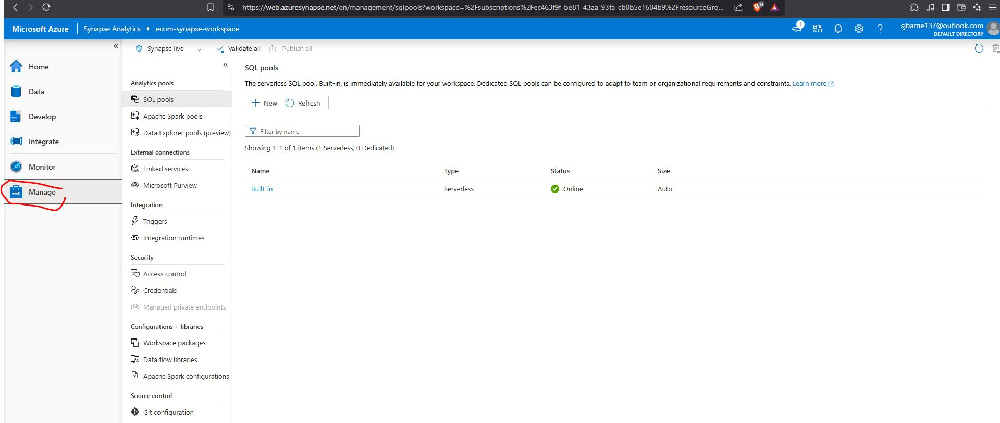

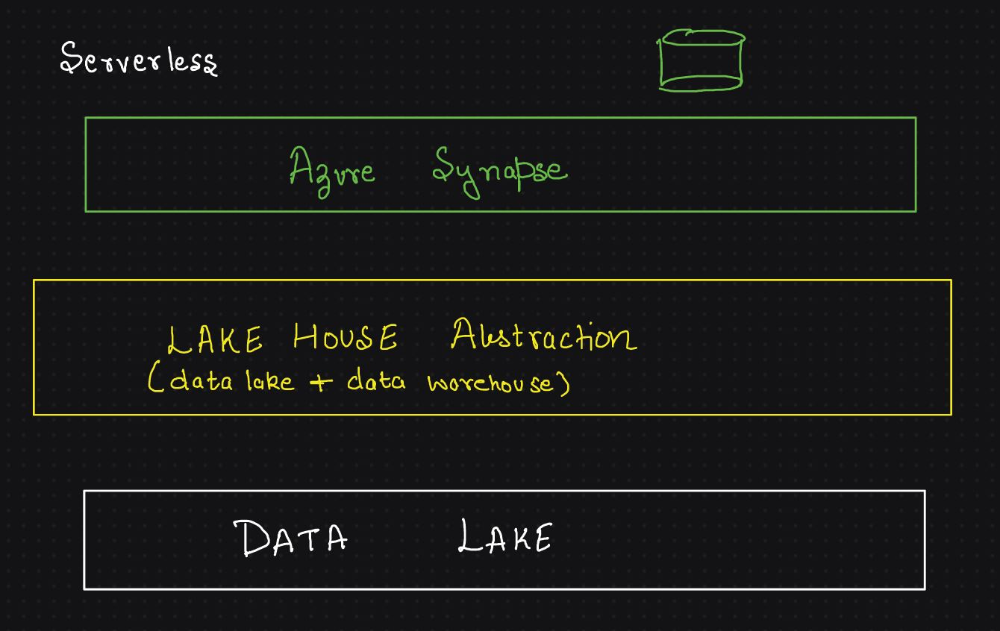

## 12.1 Granting Azure Synapse access to ADLSGen2

We need to give our Azure Synapse permission to connect to ADLSGen2. We do this by adding role assignment `Storage Blob Data Contributor` to our Azure Synapse Workspace.

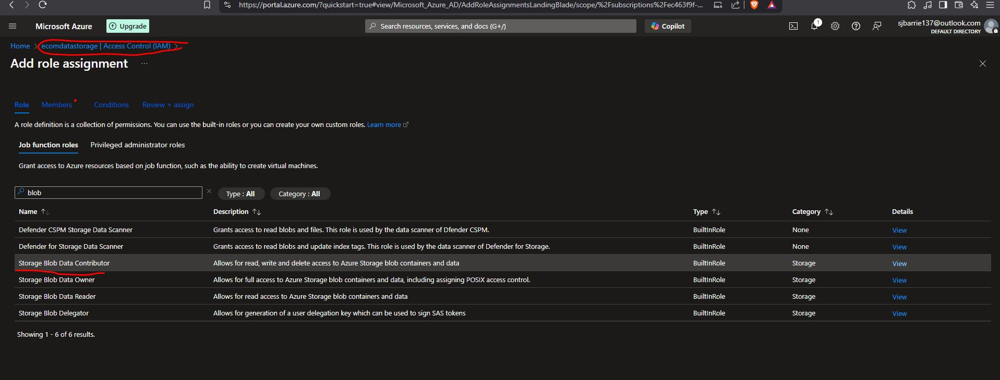

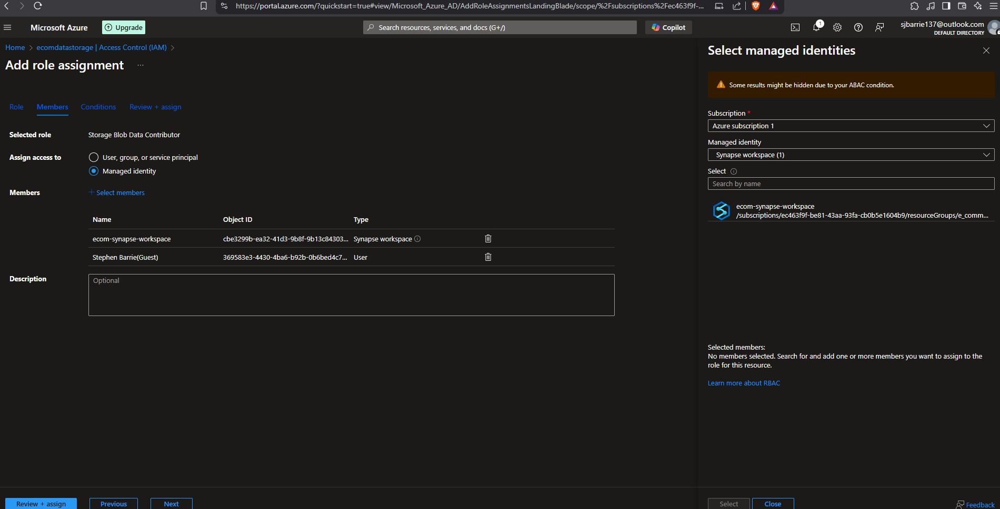

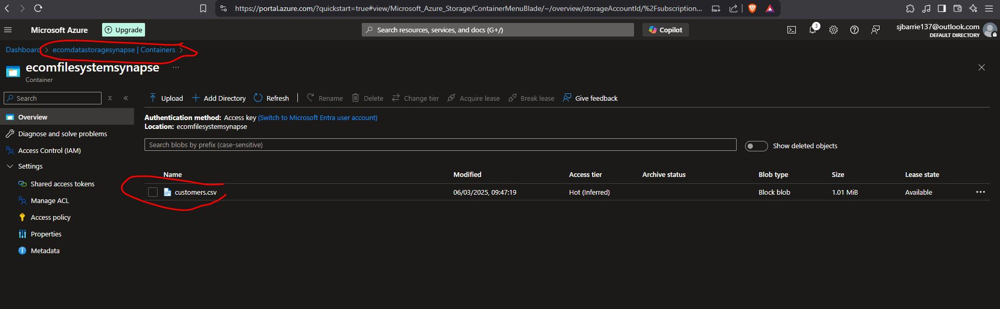

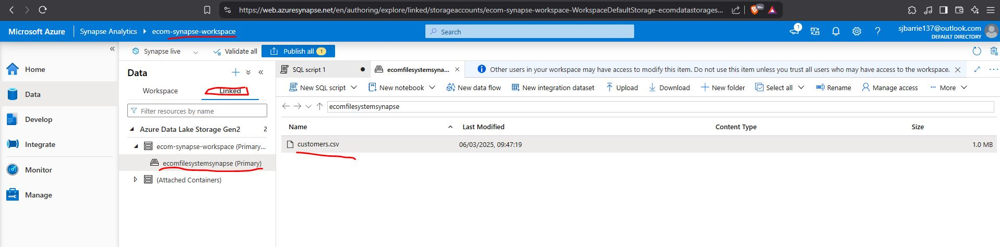

# 12.2  Serverless Vs Dedicated SQL pool

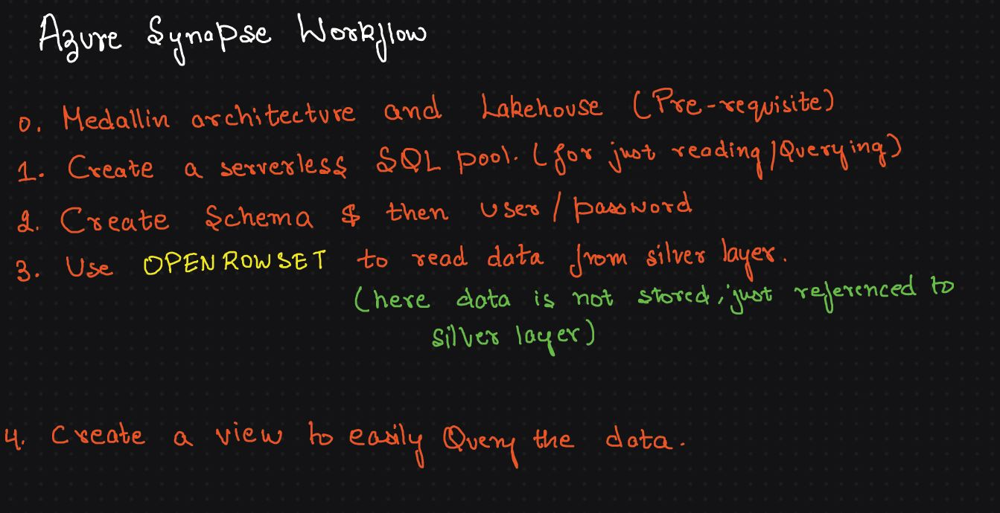

We can create a serverless SQL database in Synapse.

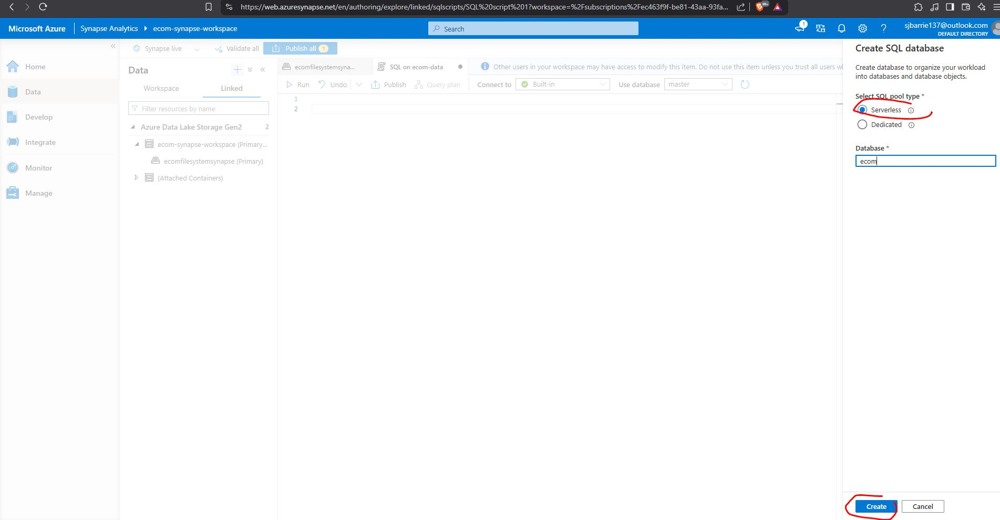

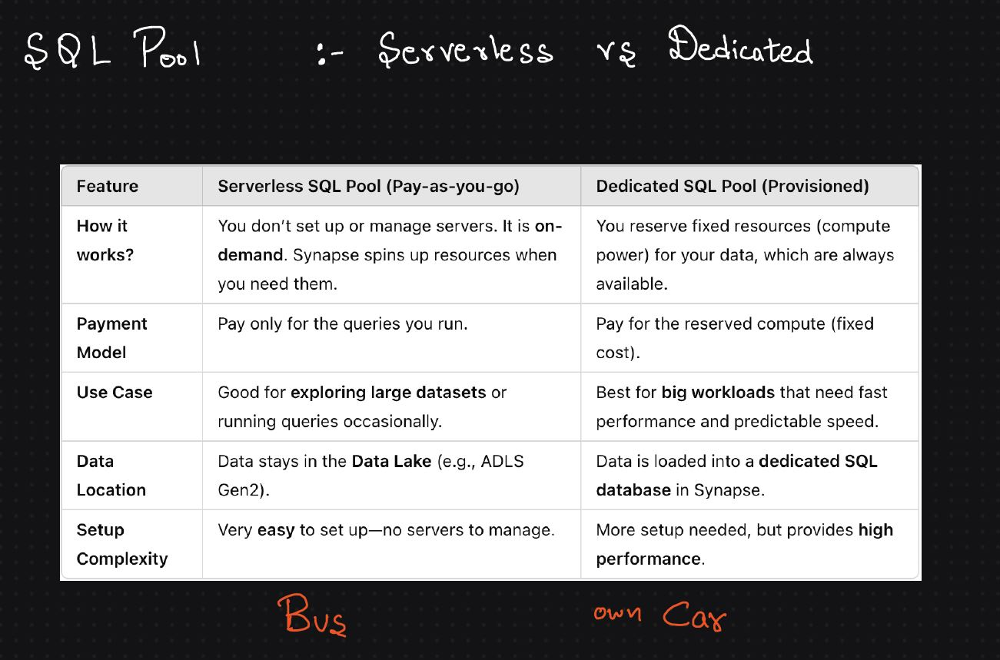

# 13. SQL queries within Synapse Analytics

## 13.1 Accessing files held in ADLSGen2
To connect with ADLSGen2 from Azure Synapse we use [OPENROWSET](https://learn.microsoft.com/en-us/sql/t-sql/functions/openrowset-transact-sql?view=sql-server-ver16).

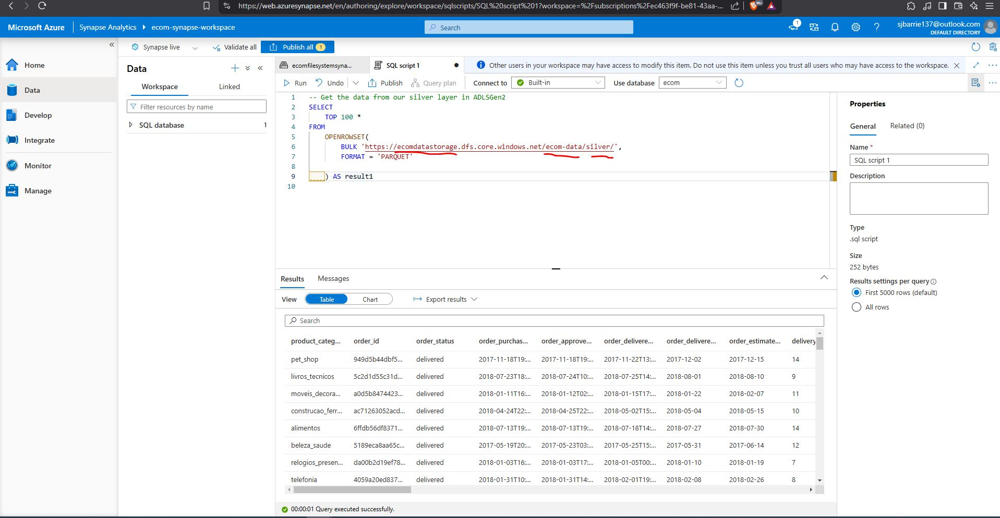

## 13.2 Create VIEWS to work with data prior to exporting as an external TABLE

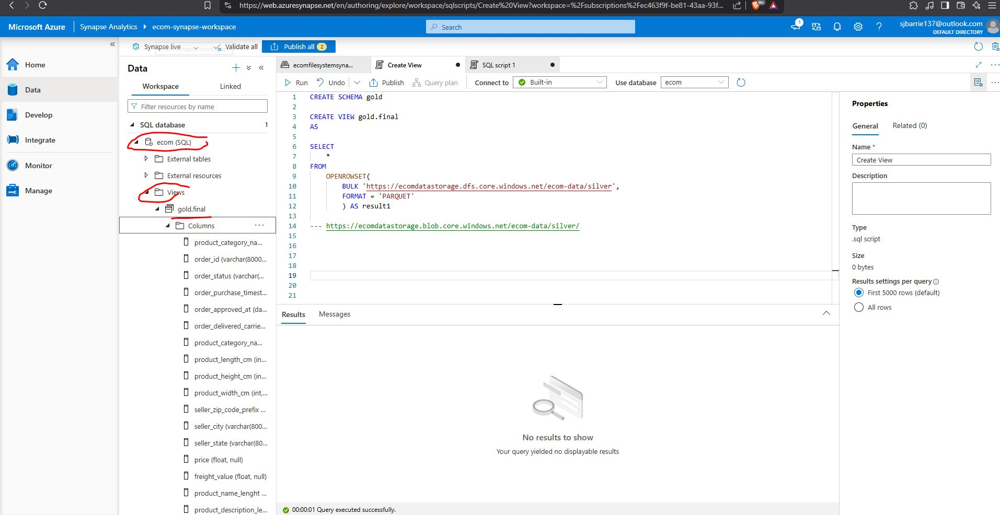

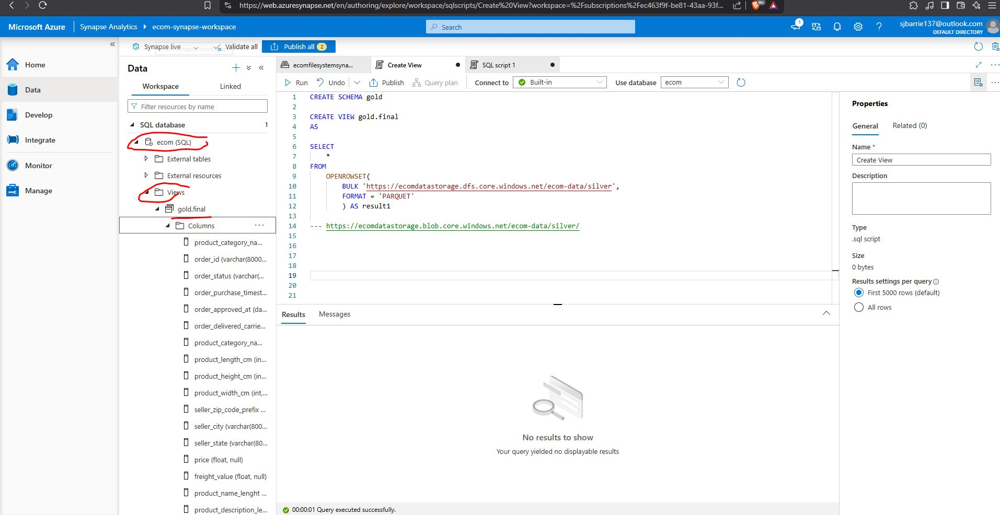

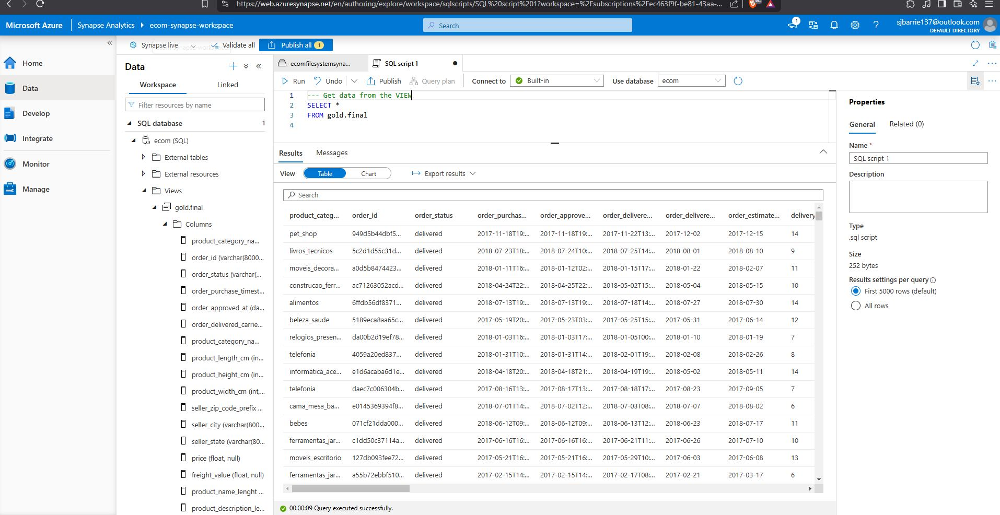

## 13.3 Visualisation within Synapse Analytics

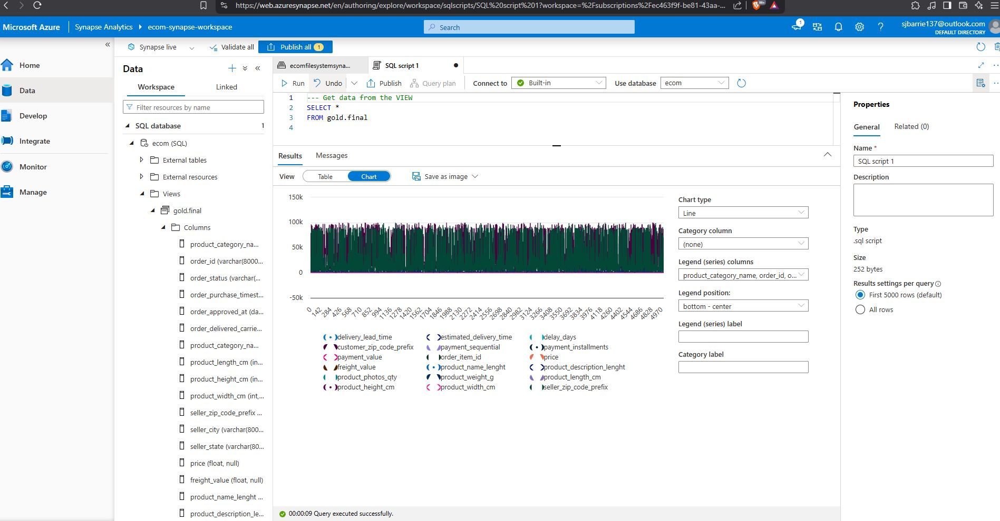

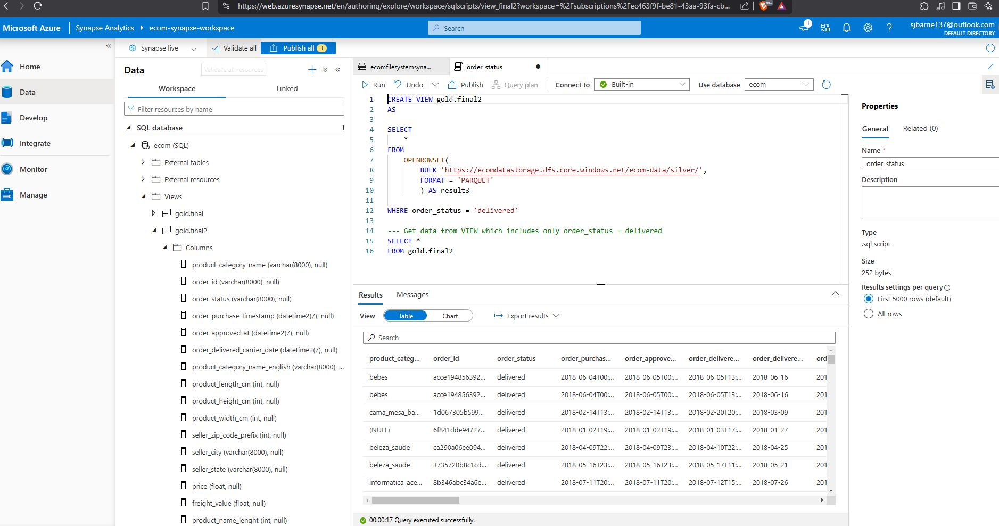

# 14 Serving our final data to the GOLD layer

We can see that we can access our SILVER layer data in ADLSGen2 storage from Synapse by using VIEWS. Once we are happy with our data, in order to serve the data to the GOLD layer, we have to create:

- a Database
- master key encryption
- database scoped credential
- external file format
- external data source
- external table

https://learn.microsoft.com/en-us/azure/synapse-analytics/sql/develop-tables-cetas#cetas-in-serverless-sql-pool

We can use CREATE EXTERNAL TABLE AS SELECT (CETAS) in a dedicated SQL pool or serverless SQL pool to complete the following tasks:

- Create an external table
- Export, in parallel, the results of a Transact-SQL SELECT statement to Azure Data Lake Storage Gen2 

In [ ]:
-- Set credentials
CREATE MASTER KEY ENCRYPTION BY PASSWORD = '<password>';
CREATE DATABASE SCOPED CREDENTIAL sjbarrieadmin WITH IDENTITY = 'Managed Identity';

-- Specify the source data format
CREATE EXTERNAL FILE FORMAT extfileformat WITH (
    FORMAT_TYPE = PARQUET,
    DATA_COMPRESSION = 'org.apache.hadoop.io.compress.SnappyCodec'
);

-- specify the location where we wish to send the data
CREATE EXTERNAL DATA SOURCE goldlayer WITH (
    LOCATION = 'https://ecomdatastorage.dfs.core.windows.net/ecom-data/gold/',
    CREDENTIAL = sjbarrieadmin
);

-- create a table for the data we want to send to the gold layer
CREATE EXTERNAL TABLE gold.final_table WITH (
        LOCATION = 'FinalServing',
        DATA_SOURCE = goldlayer,
        FILE_FORMAT = extfileformat
) AS

--- data from our VIEW which was created from the SILVER layer data
SELECT * FROM gold.final2

You can access your credentials using:

    -- View credential details
    SELECT * FROM sys.database_credentials

## 14.1 Confirm parquet file written to ADLSGen2 GOLD layer

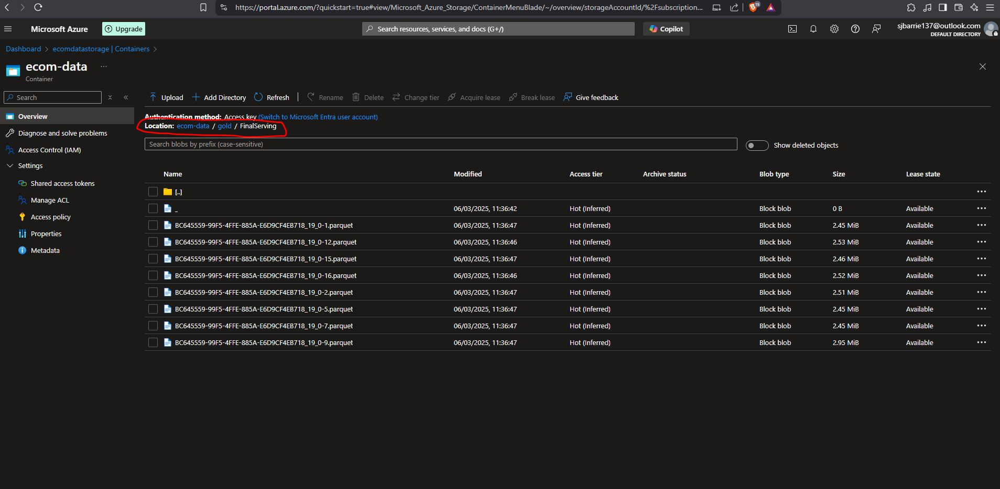


## 14.2 Run SQL queries from within Azure Synapse on data held in ADLSGen2

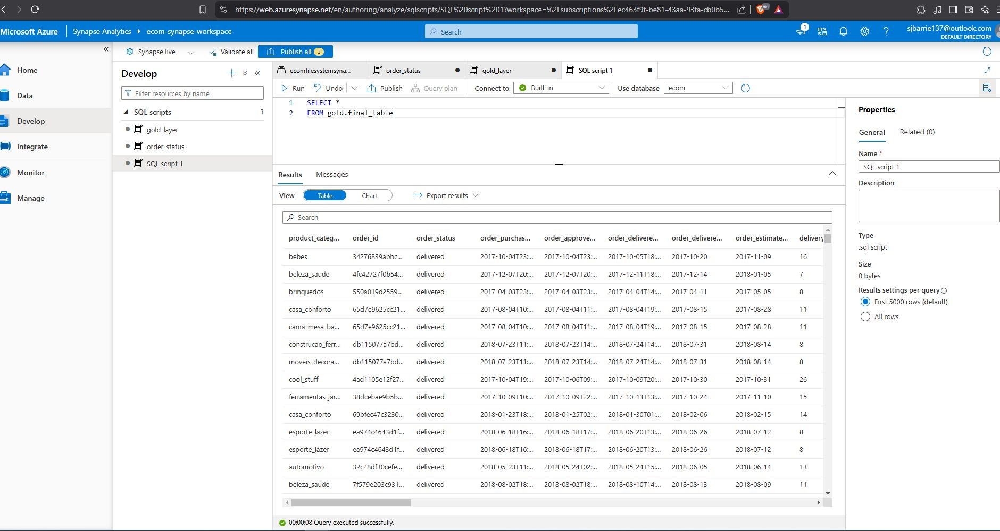


## 14.3 Access to gold layer via Serverless SQL endpoint

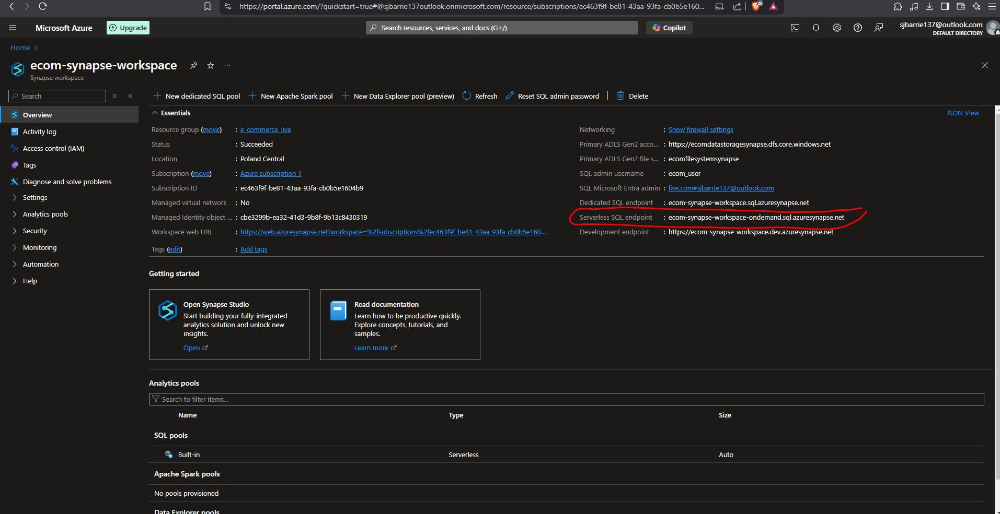